# Title of Your Group Project

This Python notebook serves as a template for your group project on Experiment 2: *Task switching with letters and numbers* for the course 'Modeling in Cognitive Science'.
This is the practical part of the group project where you get to implement the computational modeling workflow. In this part, you are expected to:


*   Implement at least two computational models relevant for your hypothesis. *(3 points)*
*   Simulate behavior from the two models. *(3 points)*
*   Implement a procedure for fitting the models to data. *(4 points)*
*   Implement a procedure for parameter recovery. *(5 points)*
*   (Implement a procedure for model recovery.) *(optional; 2 bonus points)*
*   Implement a model comparison. *(5 points)*.

You can gain a total of 20 points for the practical part of the group project.

**Note:** *Some of the exercises below (e.g. Model Simulation) rely on code from previous exercises (e.g., Model Implementation). In such cases, you are encouraged to rely on functions implemented for previous exercises. That is, you don't have to produce redundant code.*


For more information, you can check the task's GitHub repository:
[task switching with letter and numbers](https://github.com/snamazova/task_switch)


## Data Loading


In [150]:
# #Optional: Checking specs to see where to run the code
# from utils import print_cpu_specs
# print_cpu_specs()

In [151]:
import json
import os
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 18, 'font.family': "sans-serif"}) # 'font.weight': 'bold'

from data_cleaning import clean_data

SAVE_RESULTS = True
RESULTS_DIR = "results"
os.makedirs(RESULTS_DIR, exist_ok=True)

In [152]:
COLAB = False
if os.getenv("COLAB_RELEASE_TAG"):
   print("Running in Colab")
   !pip install ipywidgets
   !pip install git+https://github.com/lnccbrown/HSSM.git
   !git clone https://github.com/esmeralda-25/DynamicalSystemsModelling_TS
   from google.colab import files
   import hssm
   import hssm.plotting
   import sys
   os.chdir("/content/DynamicalSystemsModelling_TS")
   sys.path.append("/content/repository_name")
   print('repo files:', os.listdir())
   !ls -lah
   COLAB = True
   
else:
   print("NOT in Colab")

NOT in Colab


In [153]:
# upload the file manually
file_name = "data/Esma.json"

if COLAB:
    uploaded = files.upload()
    # get the filename from the uploaded dictionary
    file_name = list(uploaded.keys())[0]

# if file name does not exist, raise an error
if not os.path.exists(file_name):
    raise FileNotFoundError(f"File {file_name} not found, load a raw data file into data/ folder")

# open and load the JSON file
with open(file_name, "r") as f:
    data = json.load(f)

# convert JSON to a DataFrame
df_raw = pd.json_normalize(data)

# display the DataFrame columns to analyze it
print(df_raw.columns)
df_raw.head(1)

Index(['rt', 'stimulus', 'response', 'trial_type', 'trial_index',
       'time_elapsed', 'internal_node_id', 'bean_trial_duration',
       'bean_duration', 'bean_stimulus', 'bean_choices', 'bean_correct_key',
       'bean_type', 'bean_text', 'bean_color', 'bean_correct',
       'bean_num_correct', 'bean_accuracy', 'bean_task_type'],
      dtype='object')


,rt,stimulus,response,trial_type,trial_index,time_elapsed,internal_node_id,bean_trial_duration,bean_duration,bean_stimulus,bean_choices,bean_correct_key,bean_type,bean_text,bean_color,bean_correct,bean_num_correct,bean_accuracy,bean_task_type
0,2900.0,<div style='color:white'>Welcome to our task-s...,,html-keyboard-response,0,2914,0.0-0.0-0.0,NaN,NaN,<div style='color:white'>Welcome to our task-s...,[ ],,jsPsychHtmlKeyboardResponse,Welcome to our task-switching experiment.What ...,white,False,NaN,NaN,NaN


### DataFrame Structure Overview

The DataFrame contains multiple columns representing various aspects of a **task-switching experiment**. Below is a breakdown of the key columns:  

## 1. General Trial Information  
- **`trial_index`**: The index of the current trial in the experiment(feedback is also considered as trial)  
- **`trial_type`**: The type of trial, indicating how the response was made (e.g., via keyboard or mouse click).  
- **`time_elapsed`**: The total time elapsed (in milliseconds) since the start of the experiment.  
- **`internal_node_id`**: An internal identifier for the trial structure.  

## 2. Response and Stimulus Data  
- **`stimulus`**: The presented stimulus for the trial.  
- **`response`**: The participant’s response/input during the trial.  
- **`rt`**: The reaction time (in milliseconds) taken to respond.  

## 3. Task-Specific Information (Task-Switching Task)   
- **`bean_trial_duration`**: The duration of the bean trial  
- **`bean_duration`**: The time the bean stimulus was displayed (with a maximum duration of 2000ms; if no response is given within this time, the trial automatically switches to the next one and is considered incorrect).
- **`bean_stimulus`**: The presented stimulus for the trial.  
- **`bean_choices`**: The available choice options in the trial.  
- **`bean_correct_key`**: The correct key (button press) for the task.  
- **`bean_type`**: The category of the bean stimulus, determined by how the participant responded (e.g., clicking or pressing a key)
- **`bean_text`**: A text representation of the bean (stimulus is inside `div` tag).  
- **`bean_color`**: The color of the bean
- **`bean_correct`**: A boolean or categorical value indicating whether the response was correct.  
- **`bean_num_correct`**: The number of correct responses across trials.  
- **`bean_accuracy`**: The participant's accuracy in the task, typically computed as the proportion of correct responses.  
- **`bean_task_type`**: The type of task being performed within the task-switching paradigm(letter or number task)


In [154]:
data_cleaned = clean_data(df_raw)
# data_cleaned.head(5)
data_cleaned.tail(5)

 data cleaning done. number of valid trails: 98


,task,trial_type,response,accuracy,choice_adjusted,rt,switch,participant_response,correct_key,key_choices,stimuli,trial_index
93,letter,switch,1,0.691489,0,1.134,1,n,n,"[b, n]",E2,93
94,number,switch,1,0.694737,1,1.213,1,b,b,"[b, n]",K9,94
95,letter,switch,0,0.687500,1,2.108,1,b,n,"[b, n]",A2,95
96,letter,repeat,0,0.680412,1,1.072,0,n,b,"[b, n]",G5,96
97,letter,repeat,0,0.673469,1,1.216,0,b,n,"[b, n]",U6,97


## Model Implementation *(3 points)*

For this exercise you should:

*   Implement and simulate data from two* models that are suitable to test your hypothesis. *(3 points)*

<font size=2>*You may implement more than two models if you wish. However, two models are sufficient for this group project.</font>

Make sure to comment your code and provide an explanation for each code block in a preceding text block.


### Model Formulation

### Insight into the latent varaibles in a simulation on one trial

In [155]:
import numpy as np
import matplotlib.pyplot as plt
from model import simulate_dynamics, plot_trajectory
from model_simulation import simulate_experiment, generate_experiment_trials

In [156]:
from ipywidgets import interact, widgets

def interactive_plot_trial(g, alpha, gamma, x1_0, x2_0, P_0, feedback, tau_P):
    I1 = 1        # Input to task 1
    I2 = 0       # Input to task 2
    sigma = 0.4    # noise
    T = 4         # Simulation time

    x_0 = [x1_0, x2_0, P_0]

    input = [I1, I2]
    np.random.seed(0)

    # Run the simulationnear
    ts, x1, x2, P  = simulate_dynamics(T, x_0, g, alpha, gamma, input, feedback, sigma, tau_P,num_sample_points=100)

    # Plot the trajectory
    plt.close('all')
    plot_trajectory(T, ts, x1, x2, P, input=[np.where(np.array(input) != 1)[0][0]], feedback=[feedback])

# Create interactive sliders
g_slider = widgets.FloatSlider(value=1.5, min=0.0, max=5.0, step=0.5, description="Gain (g):")
alpha_slider = widgets.FloatSlider(value=0.1, min=0.0, max=1.0, step=0.1, description="alpha:")
gamma_slider = widgets.FloatSlider(value=0.3, min=-1.0, max=1.0, step=0.1, description="gamma:")
x1_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x1_0:")
x2_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x2_0:")
P_0_silder = widgets.FloatSlider(value=0.0, min=-1.0, max=1.0, step=0.1, description="P_0:")
tau_P_slider = widgets.FloatSlider(value=1.0, min=0.0, max=1.0, step=0.1, description="tau_P:")
feedback_slider = widgets.IntSlider(value=-1, min=-1, max=1, step=1, description="Feedback:")

# Use the interact function to create the interactive plot
interact(interactive_plot_trial, g=g_slider, alpha=alpha_slider, gamma=gamma_slider ,
         x1_0=x1_0_slider, x2_0=x2_0_slider, P_0=P_0_silder, feedback=feedback_slider, tau_P=tau_P_slider);
plt.close('all')

interactive(children=(FloatSlider(value=1.5, description='Gain (g):', max=5.0, step=0.5), FloatSlider(value=0.…

### Insight into the Dynamics of the two Models across multiple trails

In [ ]:
from ipywidgets import interact, widgets
def interactive_plot_experiment(g, c, alpha, gamma, x1_0, x2_0, P_0, tau_P, experiment_trials):
    # simulating a small sample of trials to get an insight into the dynamics for both models
    seed = 40
    T = 4
    sigma = 0.3
    c = 0
    x_0 = [x1_0, x2_0, P_0]
    
    # Base Model
    np.random.seed(seed)
    _ = simulate_experiment(num_trials, T, x_0, g, c, 0, 0, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)

    # Perseverence Model
    np.random.seed(seed)
    _ = simulate_experiment(num_trials, T, x_0, g, c, alpha, gamma, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)


num_trials = 20
experiment_trials = generate_experiment_trials(num_trials)

# Create interactive sliders
g_slider = widgets.FloatSlider(value=1.5, min=0.0, max=5.0, step=0.5, description="Gain (g):")
c_slider = widgets.FloatSlider(value=0.0, min=-2.0, max=2.0, step=0.1, description="c:")
alpha_slider = widgets.FloatSlider(value=0.1, min=0.0, max=1.0, step=0.1, description="alpha:")
gamma_slider = widgets.FloatSlider(value=0.3, min=-1.0, max=1.0, step=0.1, description="gamma:")
x1_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x1_0:")
x2_0_slider = widgets.FloatSlider(value=0.5, min=0.0, max=1.0, step=0.1, description="x2_0:")
P_0_silder = widgets.FloatSlider(value=0.0, min=-1.0, max=1.0, step=0.1, description="P_0:")
tau_P_slider = widgets.FloatSlider(value=1.0, min=0.0, max=1.0, step=0.1, description="tau_P:")
experiment_trials_fixed = widgets.fixed(experiment_trials)

# Use the interact function to create the interactive plot
interact(interactive_plot_experiment, g=g_slider, c=c_slider, alpha=alpha_slider, gamma=gamma_slider ,x1_0=x1_0_slider, x2_0=x2_0_slider, P_0=P_0_silder, 
                                        experiment_trials=experiment_trials_fixed, tau_P=tau_P_slider);
plt.close('all')

interactive(children=(FloatSlider(value=1.5, description='Gain (g):', max=5.0, step=0.5), FloatSlider(value=0.…

## Model Simulation *(3 points)*

For this exercise you should:

*   Simulate data from both models for a single set of parameters. The simulation should mimic the experiment you are trying to model. *(2 points)*

*   Plot the simulated behavior of both models. The model plots should depict key features of the behavioral data, convincing yourself that the models are suitable to capture the data. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.


In [158]:
from model_simulation import simulate_experiment, generate_experiment_trials
from analysis import *

### Surrogate Data from the two Models



In [165]:
# simulating surregate data for the experiment on all models
# experiment parameters
seed = 40
num_trials = 100
# hyperparameters
T = 2
sigma = 0.2
tau_P = 2/T
x_0 = [0.5, 0.5, 0]

# free parameters
g = 2
c = 0.0
alpha = 0.1
gamma = 0.3

# generate experiment trials
experiment_trials = generate_experiment_trials(num_trials)
# Base Model
np.random.seed(seed)
sim_Base = simulate_experiment(num_trials, T, x_0, g, c, 0, 0, sigma, tau_P, bool_plot_trajectory = False, task_sequence = experiment_trials)

# Perseverence Model
np.random.seed(seed)
sim_P = simulate_experiment(num_trials, T, x_0, g, c, 0, gamma, sigma, tau_P, bool_plot_trajectory = False, task_sequence = experiment_trials)

# Feedback model
np.random.seed(seed)
sim_F = simulate_experiment(num_trials, T, x_0, g, c, alpha, 0, sigma, tau_P, bool_plot_trajectory = False, task_sequence = experiment_trials)

# PF model
np.random.seed(seed)
sim_PF = simulate_experiment(num_trials, T, x_0, g, c, alpha, gamma, sigma, tau_P, bool_plot_trajectory = False, task_sequence = experiment_trials)

In [166]:
# printing samples of the surrogate data
print("Surregate Data from Base Model:")
display(sim_Base.head(10))

print("Surregate Data from Perserverance Model:")
display(sim_P.head(3))

print("Surregate Data from Feedback Model:")
display(sim_F.head(3))

print("Surregate Data from PF Model:")
display(sim_PF.head(3))

print('accuracy base: ', sim_Base['accuracy'].iloc[-1])
print('accuracy perseverance: ', sim_P['accuracy'].iloc[-1])
print('accuracy feedback: ', sim_F['accuracy'].iloc[-1])
print('accuracy PF: ', sim_PF['accuracy'].iloc[-1])

Surregate Data from Base Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,letter,switch,0,0.000000,1,0.685671,0.307876,"[1, 0]",1
1,letter,repeat,1,0.500000,0,0.797732,0.218336,"[1, 0]",2
2,number,switch,1,0.666667,1,0.339865,0.660639,"[0, 1]",3
3,letter,switch,0,0.500000,1,0.685982,0.306987,"[1, 0]",4
4,letter,repeat,0,0.400000,1,0.796132,0.190316,"[1, 0]",5
5,letter,repeat,1,0.500000,0,0.815558,0.168159,"[1, 0]",6
6,letter,repeat,1,0.571429,0,0.843741,0.149863,"[1, 0]",7
7,letter,repeat,1,0.625000,0,0.839173,0.169146,"[1, 0]",8
8,letter,repeat,1,0.666667,0,0.831811,0.173706,"[1, 0]",9
9,number,switch,1,0.700000,1,0.343908,0.668123,"[0, 1]",10


Surregate Data from Perserverance Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,letter,switch,0,0.0,1,0.635023,0.340377,"[1, 0]",1
1,letter,repeat,0,0.0,1,0.822267,0.183168,"[1, 0]",2
2,number,switch,0,0.0,0,0.404524,0.608234,"[0, 1]",3


Surregate Data from Feedback Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,letter,switch,1,1.0,0,0.682534,0.307560,"[1, 0]",1
1,letter,repeat,1,1.0,0,0.792844,0.240230,"[1, 0]",2
2,number,switch,1,1.0,1,0.312712,0.672294,"[0, 1]",3


Surregate Data from PF Model:


,task,trial_type,response,accuracy,choice_adjusted,activity_n1,activity_n2,correct_responses,trial_index
0,letter,switch,1,1.0,0,0.646150,0.359548,"[1, 0]",1
1,letter,repeat,1,1.0,0,0.799857,0.216179,"[1, 0]",2
2,number,switch,1,1.0,1,0.352579,0.660864,"[0, 1]",3


accuracy base:  0.7777777777777778
accuracy perseverance:  0.8080808080808081
accuracy feedback:  0.7777777777777778
accuracy PF:  0.8484848484848485


### Behavioral insight of the two models

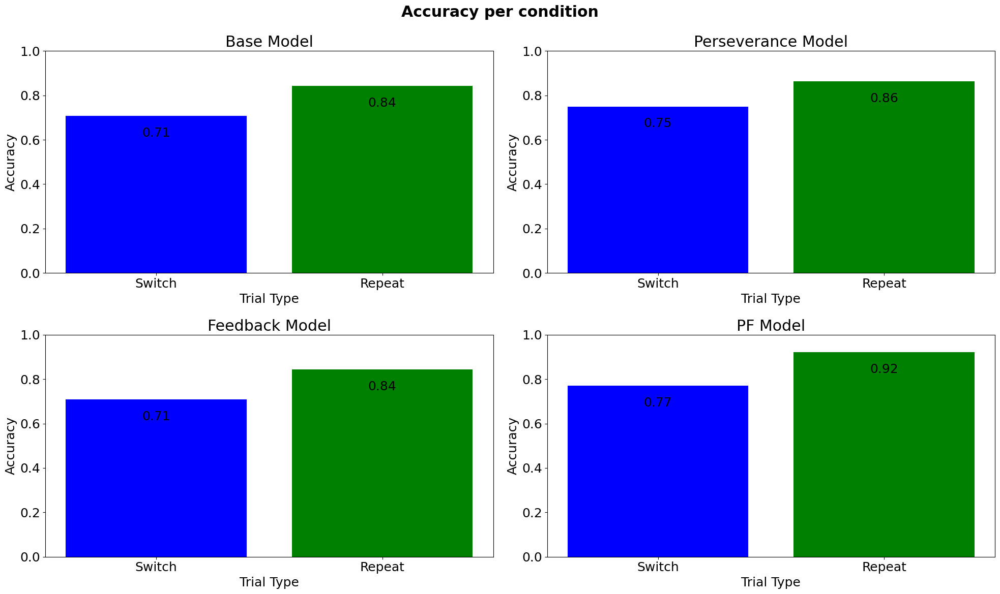

In [167]:
# Plotting the accuracy per condition of the base and perseverance model
fig, axs = plt.subplots(2, 2, figsize=(20, 12))
axs = axs.ravel()
fig.suptitle('Accuracy per condition', fontweight='bold')
acc_cond_base = calculate_accuracy_condition(sim_Base)
plot_accuracy_condition(acc_cond_base, ax=axs[0])
axs[0].set_title('Base Model')

acc_cond_P = calculate_accuracy_condition(sim_P)
plot_accuracy_condition(acc_cond_P, ax=axs[1])
axs[1].set_title('Perseverance Model')

acc_cond_F = calculate_accuracy_condition(sim_F)
plot_accuracy_condition(acc_cond_F, ax=axs[2])
axs[2].set_title('Feedback Model')

acc_cond_PF = calculate_accuracy_condition(sim_PF)
plot_accuracy_condition(acc_cond_PF, ax=axs[3])
axs[3].set_title('PF Model')

plt.tight_layout()
plt.show()

/tmp/ipykernel_185124/1229402916.py:82: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  overall_block = data.groupby("block")["response"].mean().reset_index()
/tmp/ipykernel_185124/1229402916.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  switch_block = data[data["trial_type"] == "switch"].groupby("block")["response"].mean().reset_index()
/tmp/ipykernel_185124/1229402916.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warn

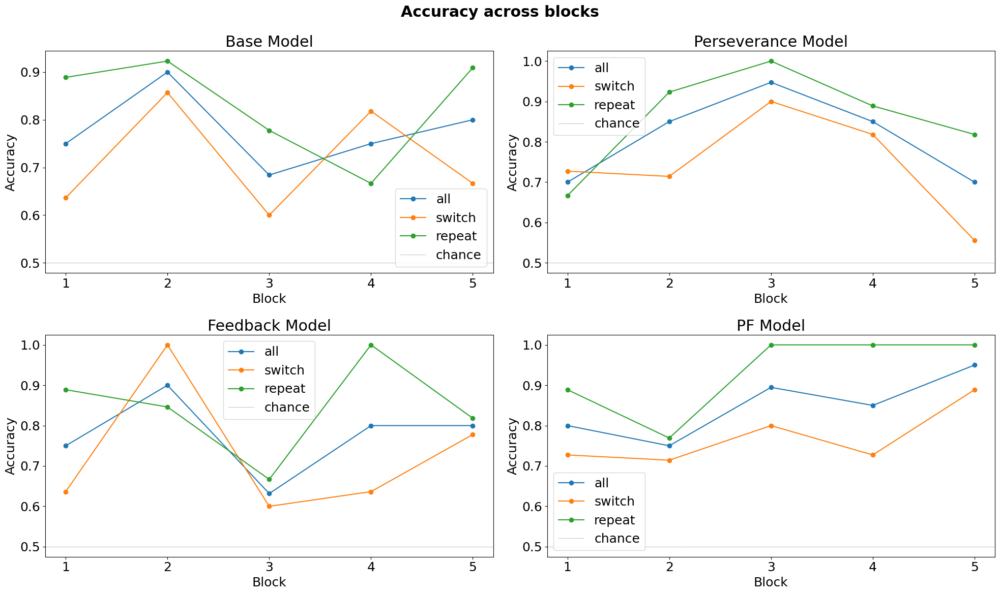

In [168]:
fig, axs = plt.subplots(2, 2, figsize=(20, 12))
axs = axs.ravel()
fig.suptitle('Accuracy across blocks', fontweight='bold')

acc_blocks_base = calculate_accuracy_across_blocks(sim_Base)
plot_accuracy_across_blocks(acc_blocks_base, ax=axs[0])
axs[0].set_title('Base Model')

acc_blocks_P = calculate_accuracy_across_blocks(sim_P)
plot_accuracy_across_blocks(acc_blocks_P, ax=axs[1])
axs[1].set_title('Perseverance Model')

acc_blocks_F = calculate_accuracy_across_blocks(sim_F)
plot_accuracy_across_blocks(acc_blocks_F, ax=axs[2])
axs[2].set_title('Feedback Model')

acc_blocks_PF = calculate_accuracy_across_blocks(sim_PF)
plot_accuracy_across_blocks(acc_blocks_PF, ax=axs[3])
axs[3].set_title('PF Model')

plt.tight_layout()
plt.show()

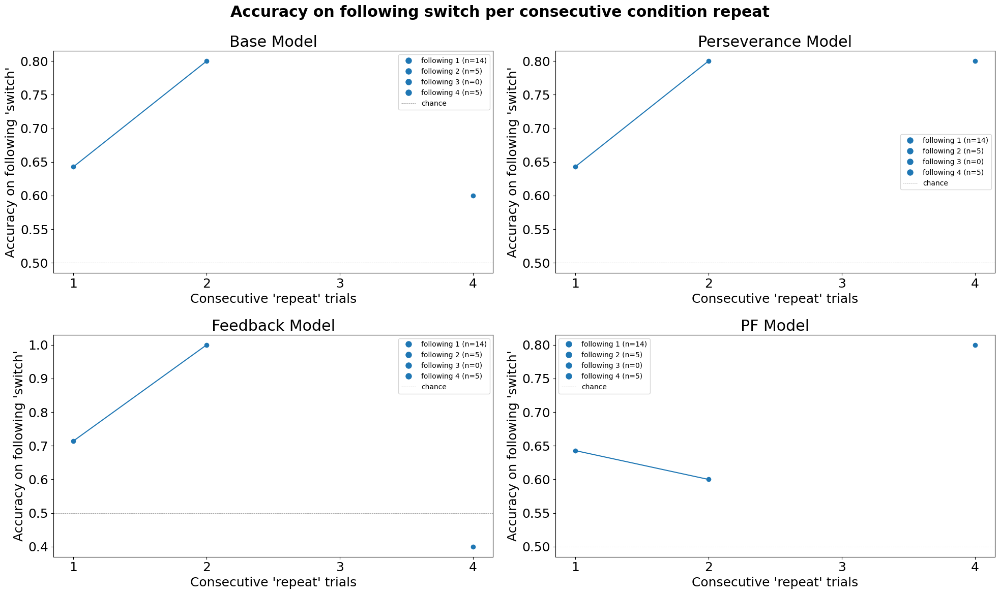

In [169]:
consecutive_condition = 'repeat'
on_condition = 'switch'
max_consecutive = 4

fig, axs = plt.subplots(2, 2, figsize=(20, 12))
axs = axs.ravel()
fig.suptitle(f'Accuracy on following {on_condition} per consecutive condition {consecutive_condition}', fontweight='bold')

acc_consecutive_base = calculate_accuracy_consecutive_condition(sim_Base, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_base, consecutive_condition, on_condition=on_condition, ax=axs[0])
axs[0].set_title('Base Model')

acc_consecutive_P = calculate_accuracy_consecutive_condition(sim_P, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_P, consecutive_condition, on_condition=on_condition, ax=axs[1])
axs[1].set_title('Perseverance Model')

acc_consecutive_F = calculate_accuracy_consecutive_condition(sim_F, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_F, consecutive_condition, on_condition=on_condition, ax=axs[2])
axs[2].set_title('Feedback Model')

acc_consecutive_PF = calculate_accuracy_consecutive_condition(sim_PF, consecutive_condition, on_condition, max_consecutive)
plot_accuracy_consecutive_condition(acc_consecutive_PF, consecutive_condition, on_condition=on_condition, ax=axs[3])
axs[3].set_title('PF Model')


plt.tight_layout()
plt.show()

## Parameter Fitting *(4 points)*

For this exercise you should:

*   Set up a suitable parameter search space *(1 point)*

*   Implement a procedure to evaluate the fit of a model based on data *(2 points)*

*   Implement a procedure for searching the parameter space. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.



In [ ]:
from parameter_fitting import param_fit_grid_search, param_fit_grid_search_parallel, plot_heatmap
from model_simulation import simulate_experiment, generate_experiment_trials, generate_experiment_trials_fromData
from analysis import *

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

### Fitting the models to either surregate or participant data

In [20]:
# Parameter Fitting
num_samples = 8

np.random.seed(seed)
# search space over parameters
min_g, max_g = 0, 5
min_c, max_c = -2, 2
min_alpha, max_alpha = 0.0, 1.0
min_gamma, max_gamma = -1, 1

# experiment parameters
num_trials = 100
seed = 40

# setting model parameters
# hyperparameters
T = 2
sigma = 0.2
tau_P = 2/T
x_0 = np.array([0.5, 0.5, 0])

# free parameters
true_g = 3
true_c = -0.5
true_alpha = 0.1
true_gamma = 0.4

g_values = np.linspace(min_g, max_g, num_samples)
c_values = np.linspace(min_c, max_c, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)


experiment_trials = generate_experiment_trials(num_trials)
# obtain surrogate data by simulating the model with the set parameters
df_base = simulate_experiment(num_trials, T, x_0, true_g, true_c, 0, 0, sigma, tau_P, task_sequence = experiment_trials)
df_P = simulate_experiment(num_trials, T, x_0, true_g, true_c, 0, true_gamma, sigma, tau_P, task_sequence = experiment_trials)
df_F = simulate_experiment(num_trials, T, x_0, true_g, true_c, true_alpha, 0, sigma, tau_P, task_sequence = experiment_trials)
df_PF = simulate_experiment(num_trials, T, x_0, true_g, true_c, true_alpha, true_gamma, sigma, tau_P, task_sequence = experiment_trials)
fit_on_participant = False

Run the cell below to fit on a participant data instead of the surrogate data generated above.

In [21]:
# fit to participant
fit_on_participant = True
df_base = data_cleaned.copy()
df_P = data_cleaned.copy()
df_F = data_cleaned.copy()
df_PF = data_cleaned.copy()

run parameter fitting on all models

In [22]:
# base model
best_params_base, best_LL_base, LL_matrix_base = param_fit_grid_search_parallel(df_base, T, x_0, g_values, c_values, np.zeros(1), np.zeros(1), sigma, tau_P)
best_g_base, best_c_base, best_alpha_base, best_gamma_base = best_params_base

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [23]:
# perseverence model
best_params_P, best_LL_P, LL_matrix_P = param_fit_grid_search_parallel(df_P, T, x_0, g_values, c_values, np.zeros(1), gamma_values, sigma, tau_P)
best_g_P, best_c_P, best_alpha_P, best_gamma_P = best_params_P

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [24]:
# feedback model
best_params_F, best_LL_F, LL_matrix_F = param_fit_grid_search_parallel(df_F, T, x_0, g_values, c_values, alpha_values, np.zeros(1), sigma, tau_P)
best_g_F, best_c_F, best_alpha_F, best_gamma_F = best_params_F                          

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [25]:
# PF model
best_params_PF, best_LL_PF, LL_matrix_PF = param_fit_grid_search_parallel(df_PF, T, x_0, g_values, c_values, alpha_values, gamma_values, sigma, tau_P)
best_g_PF, best_c_PF, best_alpha_PF, best_gamma_PF = best_params_PF

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [26]:
# print search space
print("g_values:", g_values)
print("c_values:", c_values)
print("alpha_values:", alpha_values)
print("gamma_values:", gamma_values)
if fit_on_participant:
    print("Fitting on participant data")
else:
    print("true_g:", true_g)
    print("true_c:", true_c)
    print("true_alpha:", true_alpha)
    print("true_gamma:", true_gamma)

g_values: [0.         0.71428571 1.42857143 2.14285714 2.85714286 3.57142857
 4.28571429 5.        ]
c_values: [-2.         -1.42857143 -0.85714286 -0.28571429  0.28571429  0.85714286
  1.42857143  2.        ]
alpha_values: [0.         0.14285714 0.28571429 0.42857143 0.57142857 0.71428571
 0.85714286 1.        ]
gamma_values: [-1.         -0.71428571 -0.42857143 -0.14285714  0.14285714  0.42857143
  0.71428571  1.        ]
Fitting on participant data


In [27]:
# make a df of the best fitted params and LL
model_names = ['base', 'perseverance', 'feedback', 'PF']
best_params_all = [best_params_base, best_params_P, best_params_F, best_params_PF]
best_LLs = [best_LL_base, best_LL_P, best_LL_F, best_LL_PF]

param_fitting_results = pd.DataFrame(columns=['best_g', 'best_c', 'best_alpha', 'best_gamma', 'best_LL'], index=model_names)

for model, bets_param, LL in zip(model_names, best_params_all, best_LLs):
    param_fitting_results.loc[model] = [*bets_param, LL]

param_fitting_results = param_fitting_results.astype(float).round(3)

display(param_fitting_results)

,best_g,best_c,best_alpha,best_gamma,best_LL
base,1.429,-0.286,0.000,0.000,-61.658
perseverance,1.429,-0.286,0.000,-0.143,-61.657
feedback,1.429,-0.286,0.000,0.000,-61.644
PF,1.429,0.286,0.429,-1.000,-48.330


,best_g,best_c,best_alpha,best_gamma,best_LL
base,1.429,-0.286,0.0,0.0,-61.658


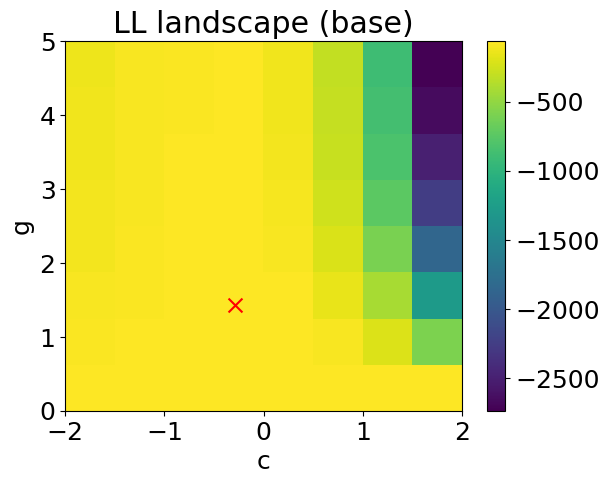

Saved to results/LL_landscape_base.png


In [28]:
# base model
display(param_fitting_results.loc['base'].to_frame().T)

ax = plot_heatmap(LL_matrix_base[:,:,0,0], c_values, g_values, 'c', 'g', f'LL landscape (base)')
ax.scatter(best_c_base, best_g_base, color='r', s=100 , marker='x')
plt.show()
if SAVE_RESULTS:
    ax.figure.savefig(f'{RESULTS_DIR}/LL_landscape_base.png')
    print(f"Saved to {RESULTS_DIR}/LL_landscape_base.png")

In [29]:
# Fix indices for best parameters (for slicing the 4D LL_matrix_P)
g_idx_fixed = np.argmin(np.abs(g_values - best_g_PF))
c_idx_fixed = np.argmin(np.abs(c_values - best_c_PF))
alpha_idx_fixed = np.argmin(np.abs(alpha_values - best_alpha_PF))
gamma_idx_fixed = np.argmin(np.abs(gamma_values - best_gamma_PF))

,best_g,best_c,best_alpha,best_gamma,best_LL
perseverance,1.429,-0.286,0.0,-0.143,-61.657


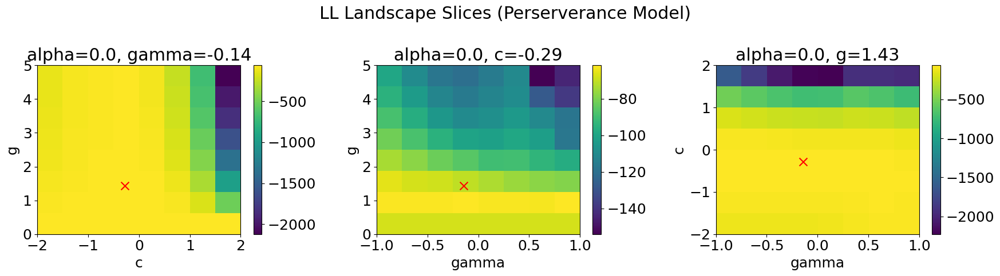

Saved to results/LL_landscape_P.png


In [ ]:
# perseverence model
display(param_fitting_results.loc['perseverance'].to_frame().T)

fig, axs = plt.subplots(1, 3, figsize=(18, 5))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
fig.suptitle('LL Landscape Slices (Perserverance Model)', fontweight='bold')
axs = axs.ravel()

# fix alpha gamma, vary g c
plot_heatmap(LL_matrix_P[:, :, 0, gamma_idx_fixed],
             c_values, g_values, 'c', 'g',
             title=f'alpha={np.round(best_alpha_P, 2)}, gamma={np.round(best_gamma_P, 2)}',
             ax=axs[0])
axs[0].scatter(best_c_P, best_g_P, color='red', s=100, marker='x')

# fix alpha c, vary g and gamma
plot_heatmap(LL_matrix_P[:, c_idx_fixed, 0, :],
             gamma_values, g_values, 'gamma', 'g',
             title=f'alpha={np.round(best_alpha_P, 2)}, c={np.round(best_c_P, 2)}',
             ax=axs[1])
axs[1].scatter(best_gamma_P, best_g_P, color='red', s=100, marker='x')

# fix g alpha, vary c and gamma
plot_heatmap(LL_matrix_P[c_idx_fixed, :, 0, :],
             gamma_values, c_values, 'gamma', 'c',
             title=f'alpha={np.round(best_alpha_P, 2)}, g={np.round(best_g_P, 2)}',
             ax=axs[2])
axs[2].scatter(best_gamma_P, best_c_P, color='red', s=100, marker='x')


plt.tight_layout()
plt.show()
if SAVE_RESULTS:
    fig.savefig(f'{RESULTS_DIR}/LL_landscape_P.png')
    print(f"Saved to {RESULTS_DIR}/LL_landscape_P.png")

,best_g,best_c,best_alpha,best_gamma,best_LL
feedback,1.429,-0.286,0.0,0.0,-61.644


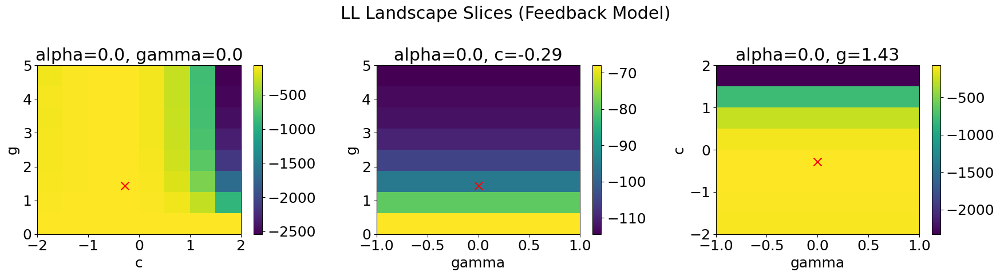

Saved to results/LL_landscape_F.png


In [ ]:
# feedback model
display(param_fitting_results.loc['feedback'].to_frame().T)

fig, axs = plt.subplots(1, 3, figsize=(18, 5))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
fig.suptitle('LL Landscape Slices (Feedback Model)', fontweight='bold')
axs = axs.ravel()

# fix alpha gamma, vary g c
plot_heatmap(LL_matrix_F[:, :, alpha_idx_fixed, 0],
             c_values, g_values, 'c', 'g',
             title=f'alpha={np.round(best_alpha_F, 2)}, gamma={np.round(best_gamma_F, 2)}',
             ax=axs[0])
axs[0].scatter(best_c_F, best_g_F, color='red', s=100, marker='x')

# fix alpha c, vary g and gamma
plot_heatmap(LL_matrix_F[:, c_idx_fixed, alpha_idx_fixed, :],
             gamma_values, g_values, 'gamma', 'g',
             title=f'alpha={np.round(best_alpha_F, 2)}, c={np.round(best_c_F, 2)}',
             ax=axs[1])
axs[1].scatter(best_gamma_F, best_g_F, color='red', s=100, marker='x')

# fix g alpha, vary c and gamma
plot_heatmap(LL_matrix_F[c_idx_fixed, :, alpha_idx_fixed, :],
             gamma_values, c_values, 'gamma', 'c',
             title=f'alpha={np.round(best_alpha_F, 2)}, g={np.round(best_g_F, 2)}',
             ax=axs[2])
axs[2].scatter(best_gamma_F, best_c_F, color='red', s=100, marker='x')

plt.tight_layout()
plt.show()
if SAVE_RESULTS:
    fig.savefig(f'{RESULTS_DIR}/LL_landscape_F.png')
    print(f"Saved to {RESULTS_DIR}/LL_landscape_F.png")

,best_g,best_c,best_alpha,best_gamma,best_LL
PF,1.429,0.286,0.429,-1.0,-48.33


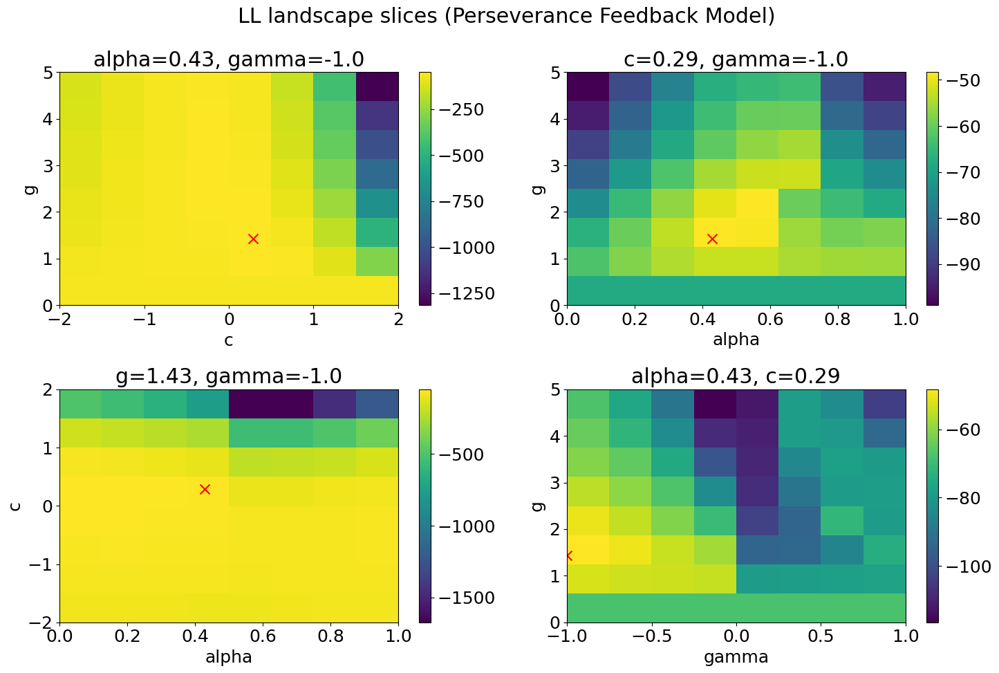

Saved to results/LL_landscape_PF.png


In [ ]:
# PF model
display(param_fitting_results.loc['PF'].to_frame().T)

fig, axs = plt.subplots(2, 2, figsize=(15, 10))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
fig.suptitle('LL landscape slices (Perseverance Feedback Model)', fontweight='bold')
axs = axs.ravel()

# fix alpha gamma, vary c g
plot_heatmap(LL_matrix_PF[:, :, alpha_idx_fixed, gamma_idx_fixed], 
             c_values, g_values, 'c', 'g', 
             title=f'alpha={np.round(best_alpha_PF, 2)}, gamma={np.round(best_gamma_PF, 2)}',
             ax=axs[0])
axs[0].scatter(best_c_PF, best_g_PF, color='red', s=100, marker='x')

# fix c gamma, vary g alpha
plot_heatmap(LL_matrix_PF[:, c_idx_fixed, :, gamma_idx_fixed], 
             alpha_values, g_values, 'alpha', 'g', 
             title=f'c={np.round(best_c_PF, 2)}, gamma={np.round(best_gamma_PF, 2)}',
             ax=axs[1])
axs[1].scatter(best_alpha_PF, best_g_PF, color='red', s=100, marker='x')

# fix g gamma, vary c, alpha
plot_heatmap(LL_matrix_PF[g_idx_fixed, :, alpha_idx_fixed, :], 
             alpha_values, c_values, 'alpha', 'c', 
             title=f'g={np.round(best_g_PF, 2)}, gamma={np.round(best_gamma_PF, 2)}',
             ax=axs[2])
axs[2].scatter(best_alpha_PF, best_c_PF, color='red', s=100, marker='x')

# fix c alpha, vary g, gamma
plot_heatmap(LL_matrix_PF[:, c_idx_fixed, alpha_idx_fixed, :], 
             gamma_values, g_values, 'gamma', 'g', 
             title=f'alpha={np.round(best_alpha_PF, 2)}, c={np.round(best_c_PF, 2)}',
             ax=axs[3])
axs[3].scatter(best_gamma_PF, best_g_PF, color='red', s=100, marker='x')

plt.tight_layout()
plt.show()
if SAVE_RESULTS:
    fig.savefig(f'{RESULTS_DIR}/LL_landscape_PF.png')
    print(f"Saved to {RESULTS_DIR}/LL_landscape_PF.png")

#### brief inspection of the fitted models, as a sanity check

,best_g,best_c,best_alpha,best_gamma,best_LL
base,1.429,-0.286,0.0,0.0,-61.658


Ploting first 20 trials:


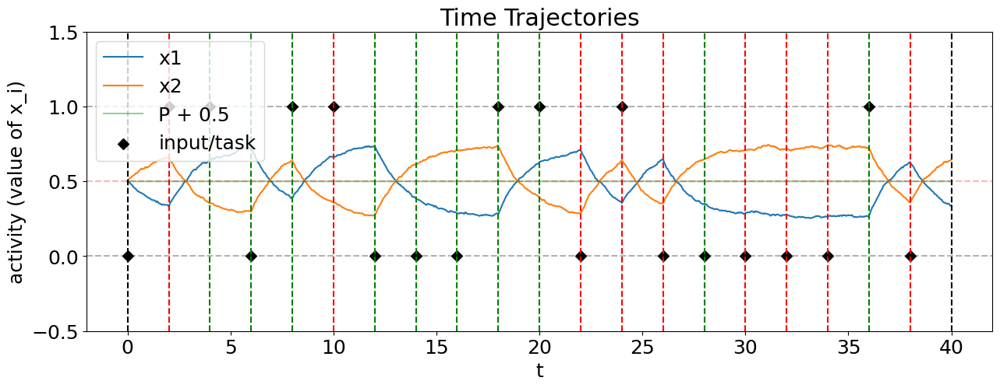

,best_g,best_c,best_alpha,best_gamma,best_LL
perseverance,1.429,-0.286,0.0,-0.143,-61.657


Ploting first 20 trials:


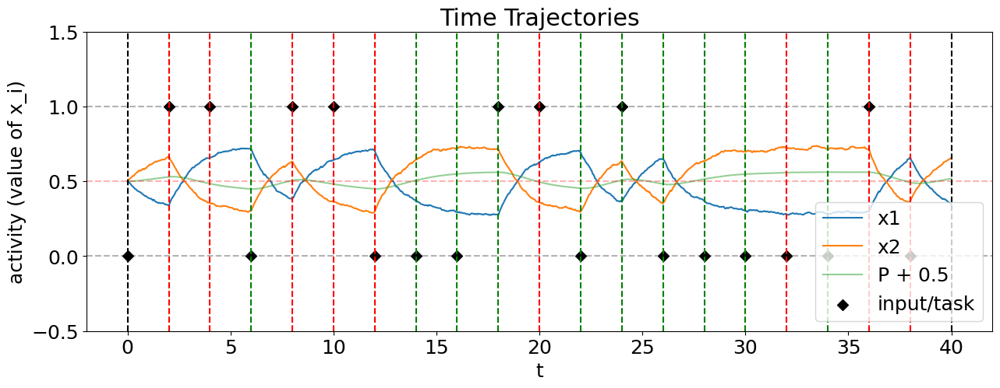

,best_g,best_c,best_alpha,best_gamma,best_LL
feedback,1.429,-0.286,0.0,0.0,-61.644


Ploting first 20 trials:


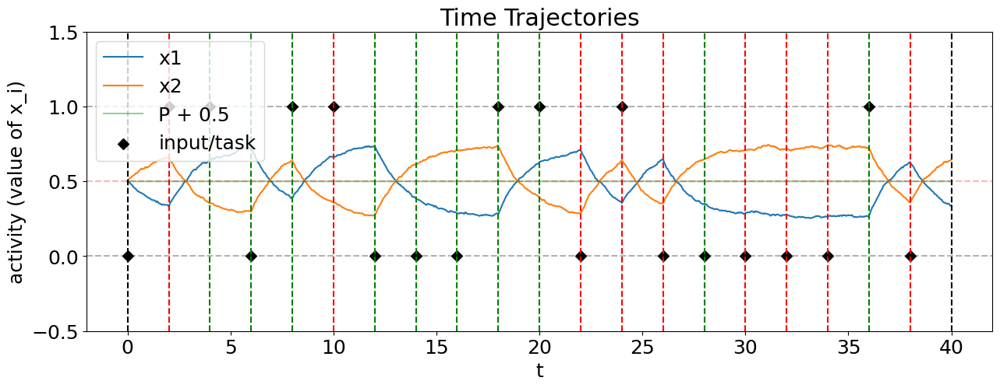

,best_g,best_c,best_alpha,best_gamma,best_LL
PF,1.429,0.286,0.429,-1.0,-48.33


Ploting first 20 trials:


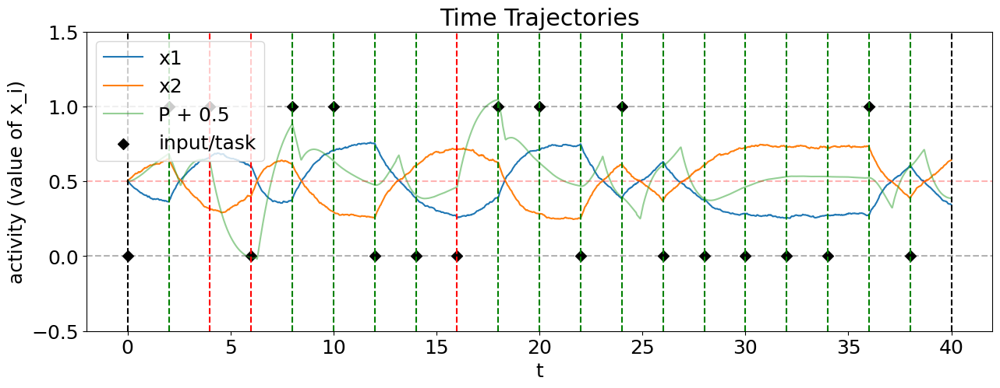

<Figure size 640x480 with 0 Axes>

In [ ]:
# simulating a small sample of trials to get an insight into the dynamics of fitted models
seed = 40

experiment_trials = generate_experiment_trials(num_trials) # randome sequence of tasks
experiment_trials = generate_experiment_trials_fromData(data_cleaned) # or same sequence as the fitting data

# Base Model
np.random.seed(seed)
display(param_fitting_results.loc['base'].to_frame().T)
data_Base = simulate_experiment(num_trials, T, x_0, best_g_base, best_c_base, best_alpha_base, best_gamma_base, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)

# Perseverence Model
np.random.seed(seed)
display(param_fitting_results.loc['perseverance'].to_frame().T)
data_P = simulate_experiment(num_trials, T, x_0, best_g_P, best_c_P, best_alpha_P, best_gamma_P, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)
# Feedback Model
np.random.seed(seed)
display(param_fitting_results.loc['feedback'].to_frame().T)
data_F = simulate_experiment(num_trials, T, x_0, best_g_F, best_c_F, best_alpha_F, best_gamma_F, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)

# Perseverance Feedback Model
np.random.seed(seed)
display(param_fitting_results.loc['PF'].to_frame().T)
data_PF = simulate_experiment(num_trials, T, x_0, best_g_PF, best_c_PF, best_alpha_PF, best_gamma_PF, sigma, tau_P, bool_plot_trajectory = True, task_sequence = experiment_trials)

accuracy base:  0.5979381443298969
accuracy perserverance:  0.6082474226804123
accuracy participant:  0.673469387755102
accuracy perserverance feedback:  0.8144329896907216
{'accuracy_switch': 0.4883720930232558, 'accuracy_repeat': 0.6851851851851852}  (base)
{'accuracy_switch': 0.5581395348837209, 'accuracy_repeat': 0.6481481481481481}  (P)
{'accuracy_switch': 0.6363636363636364, 'accuracy_repeat': 0.7037037037037037}  (participant)
{'accuracy_switch': 0.7674418604651163, 'accuracy_repeat': 0.8518518518518519}  (PF)


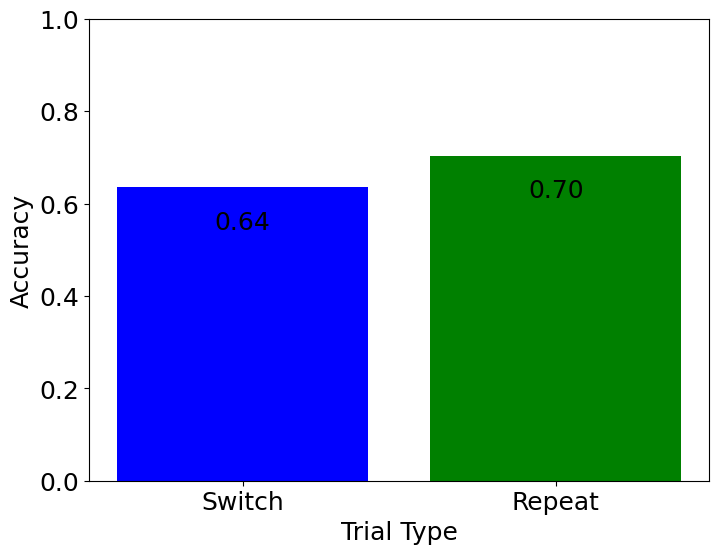

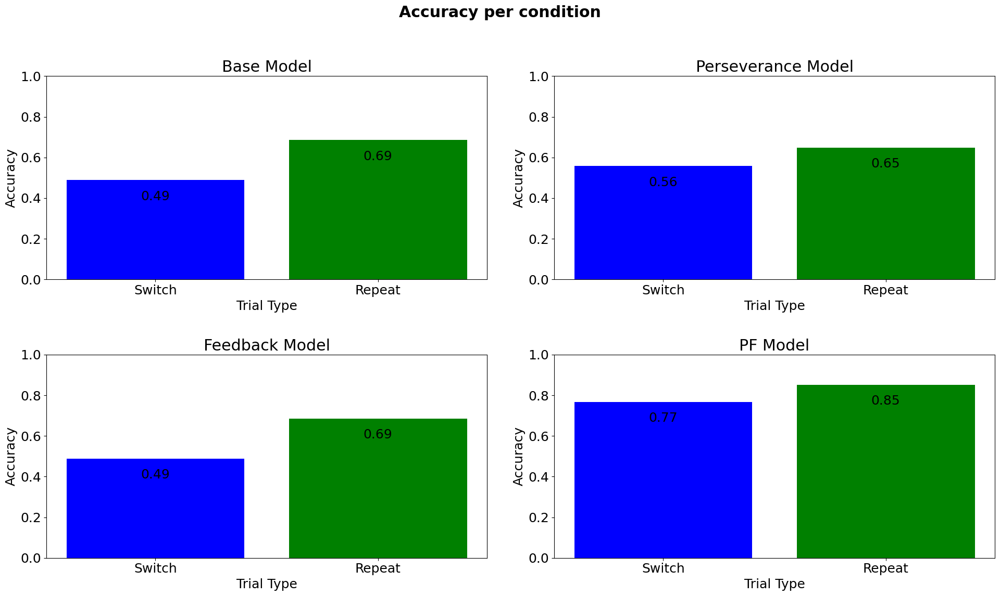

In [148]:
# plot accuary over trails for both models
print('accuracy base: ', data_Base.iloc[-1]['accuracy'])
print('accuracy perserverance: ', data_P.iloc[-1]['accuracy'])
print('accuracy participant: ', data_cleaned.iloc[-1]['accuracy'])
print('accuracy perserverance feedback: ', data_PF.iloc[-1]['accuracy'])

compare_base = calculate_accuracy_condition(data_Base)
compare_P = calculate_accuracy_condition(data_P)
compare_participant = calculate_accuracy_condition(data_cleaned)
compare_PF = calculate_accuracy_condition(data_PF)

print(compare_base, ' (base)')
print(compare_P, ' (P)')
print(compare_participant, ' (participant)')
print(compare_PF, ' (PF)')

# plot reference
acc_cond_ref_data = calculate_accuracy_condition(data_cleaned)
plot_accuracy_condition(acc_cond_ref_data)

fig, axs = plt.subplots(2, 2, figsize=(20, 12))
axs = axs.ravel()
fig.suptitle('Accuracy per condition', fontweight='bold')

acc_cond_base = calculate_accuracy_condition(data_Base)
plot_accuracy_condition(acc_cond_base, ax=axs[0])
axs[0].set_title('Base Model')

acc_cond_P = calculate_accuracy_condition(data_P)
plot_accuracy_condition(acc_cond_P, ax=axs[1])
axs[1].set_title('Perseverance Model')

acc_cond_F = calculate_accuracy_condition(data_F)
plot_accuracy_condition(acc_cond_F, ax=axs[2])
axs[2].set_title('Feedback Model')

acc_cond_PF = calculate_accuracy_condition(data_PF)
plot_accuracy_condition(acc_cond_PF, ax=axs[3])
axs[3].set_title('PF Model')


plt.tight_layout(pad=2.0)   
plt.show()

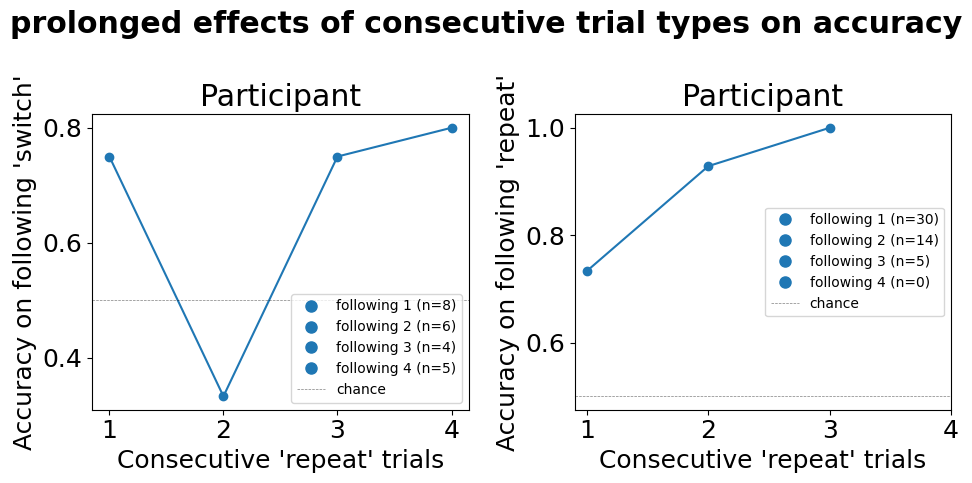

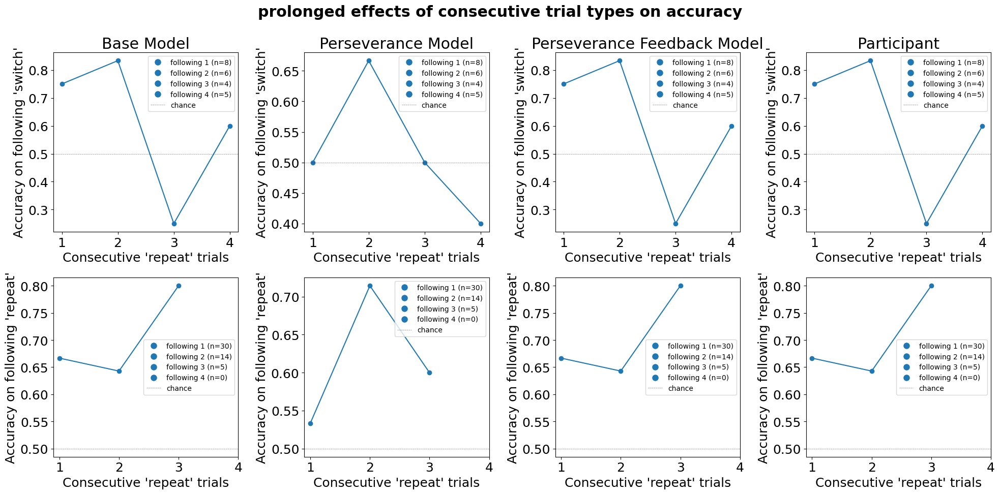

In [149]:
num_max_consecetive = 4

# reference data
fig_ref, axs_ref = plt.subplots(1, 2, figsize=(10, 5))
axs_ref = axs_ref.ravel()
fig_ref.suptitle('prolonged effects of consecutive trial types on accuracy', fontweight='bold')

acc_consecutive_ref_rs = calculate_accuracy_consecutive_condition(data_cleaned, 'repeat', 'switch', num_max_consecetive)
plot_accuracy_consecutive_condition(acc_consecutive_ref_rs, 'repeat', 'switch', ax=axs_ref[0])
acc_consecutive_ref_rr = calculate_accuracy_consecutive_condition(data_cleaned, 'repeat', 'repeat', num_max_consecetive)
plot_accuracy_consecutive_condition(acc_consecutive_ref_rr, 'repeat', 'repeat', ax=axs_ref[1])
axs_ref[0].set_title('Participant')
axs_ref[1].set_title('Participant')

plt.tight_layout()
plt.show() 

# plot in one figuire
fig, axs = plt.subplots(2, 4, figsize=(20, 10))
axs = axs.ravel()
fig.suptitle('prolonged effects of consecutive trial types on accuracy', fontweight='bold')

# plot the accuracy per consecutive condition
acc_consecutive_base_rs = calculate_accuracy_consecutive_condition(data_Base, 'repeat', 'switch', num_max_consecetive)
plot_accuracy_consecutive_condition(acc_consecutive_base_rs, 'repeat', 'switch', ax=axs[0])
acc_consecutive_P_rs = calculate_accuracy_consecutive_condition(data_P, 'repeat', 'switch', num_max_consecetive)
plot_accuracy_consecutive_condition(acc_consecutive_P_rs, 'repeat', 'switch', ax=axs[1])
acc_consecutive_F_rs = calculate_accuracy_consecutive_condition(data_F, 'repeat', 'switch', num_max_consecetive)
plot_accuracy_consecutive_condition(acc_consecutive_F_rs, 'repeat', 'switch', ax=axs[2])
acc_consecutive_PF_rs = calculate_accuracy_consecutive_condition(data_PF, 'repeat', 'switch', num_max_consecetive)
acc_consecutive_F_rs = calculate_accuracy_consecutive_condition(data_F, 'repeat', 'switch', num_max_consecetive)
plot_accuracy_consecutive_condition(acc_consecutive_F_rs, 'repeat', 'switch', ax=axs[3])

acc_consecutive_base_rr = calculate_accuracy_consecutive_condition(data_Base, 'repeat', 'repeat', num_max_consecetive)
plot_accuracy_consecutive_condition(acc_consecutive_base_rr, 'repeat', 'repeat', ax=axs[4])
acc_consecutive_P_rr = calculate_accuracy_consecutive_condition(data_P, 'repeat', 'repeat', num_max_consecetive)
plot_accuracy_consecutive_condition(acc_consecutive_P_rr, 'repeat', 'repeat', ax=axs[5])
acc_consecutive_F_rr = calculate_accuracy_consecutive_condition(data_F, 'repeat', 'repeat', num_max_consecetive)
plot_accuracy_consecutive_condition(acc_consecutive_F_rr, 'repeat', 'repeat', ax=axs[6])
acc_consecutive_F_rr = calculate_accuracy_consecutive_condition(data_F, 'repeat', 'repeat', num_max_consecetive)
plot_accuracy_consecutive_condition(acc_consecutive_F_rr, 'repeat', 'repeat', ax=axs[7])

# set a title of the 4 plots in each column (Base, Perseverance, Perseverance Feedback, Participant)
axs[0].set_title('Base Model')
axs[1].set_title('Perseverance Model')
axs[2].set_title('Perseverance Feedback Model')
axs[3].set_title('Participant')

plt.tight_layout()
plt.show()

## Parameter Recovery *(5 points)*

For this exercise you should:

*   Set up a suitable space of parameters relevant for parameter recovery *(1 point)*

*   Use the functions above to generate behavior from a models, for a given set of (randomly sampled) parameters, and then fit the model to its generated data. Make sure to evaluate the parameter fit in a quantiative manner. *(3 points)*

*   Plot the parameter recovery results for both models. *(1 point)*

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from parameter_recovery import param_recovery, summarize_paramRecovery_results, plot_true_fitted_correlation, plot_cross_correlation

In [37]:
# Parameter Recovery
# Number of true values we seek to simulate and num of search values for fitting
num_true_param_set = 20
num_samples = 8

np.random.seed(1)
# Experiment parameters
num_trials = 100
T = 2
sigma = 0.2
tau_P = T/2
x_0 = np.array([0.5, 0.5, 0])

# Range of simulated and tested values for c, g, alpha, gamma
min_g, max_g = 0, 5
min_c, max_c = -2, 2
min_alpha, max_alpha = 0.0, 1.0
min_gamma, max_gamma = -1, 1

# Determine range of parameters for fitting
g_values = np.linspace(min_g, max_g, num_samples)
c_values = np.linspace(min_c, max_c, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)

# param sets/combinations to recover
to_recover_g = np.random.uniform(min_g, max_g, num_true_param_set)
to_recover_c = np.random.uniform(min_c, max_c, num_true_param_set)
to_recover_alpha = np.random.uniform(min_alpha, max_alpha, num_true_param_set)
to_recover_gamma = np.random.uniform(min_gamma, max_gamma, num_true_param_set)

In [38]:
# base model
fitted_g_log_base, fitted_c_log_base, fitted_alpha_log_base, fitted_gamma_log_base, LL_log_base = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, np.zeros(num_true_param_set), np.zeros(num_true_param_set),
                                                                        g_values, c_values, np.zeros(1), np.zeros(1), sigma, tau_P)

run:   0%|          | 0/20 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [39]:
# perseverence model
fitted_g_log_P, fitted_c_log_P, fitted_alpha_log_P, fitted_gamma_log_P, LL_log_P = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, np.zeros(num_true_param_set), to_recover_gamma,
                                                                        g_values, c_values, np.zeros(1), gamma_values, sigma, tau_P)

run:   0%|          | 0/20 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [40]:
# feedback model
fitted_g_log_F, fitted_c_log_F, fitted_alpha_log_F, fitted_gamma_log_F, LL_log_F = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, to_recover_alpha, np.zeros(num_true_param_set),
                                                                        g_values, c_values, alpha_values, np.zeros(1), sigma, tau_P)

run:   0%|          | 0/20 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [41]:
# PF model
fitted_g_log_PF, fitted_c_log_PF, fitted_alpha_log_PF, fitted_gamma_log_PF, LL_log_PF = param_recovery(num_trials, T, x_0,
                                                                        to_recover_g, to_recover_c, to_recover_alpha, to_recover_gamma,
                                                                        g_values, c_values, alpha_values, gamma_values, sigma, tau_P)

run:   0%|          | 0/20 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

In [42]:
param_names = ['g', 'c', 'alpha', 'gamma']

# summarize the results
# base
results_base, inter_corr_base, cross_corr_base = summarize_paramRecovery_results(param_names, to_recover_g, to_recover_c, np.zeros(num_true_param_set), np.zeros(num_true_param_set),
                                                                                    fitted_g_log_base, fitted_c_log_base, fitted_alpha_log_base, fitted_gamma_log_base, LL_log_base)
# perseverence
results_P, inter_corr_P, cross_corr_P = summarize_paramRecovery_results(param_names, to_recover_g, to_recover_c, np.zeros(num_true_param_set), to_recover_gamma,
                                                                                    fitted_g_log_P, fitted_c_log_P, fitted_alpha_log_P, fitted_gamma_log_P, LL_log_P)
# feedback
results_F, inter_corr_F, cross_corr_F = summarize_paramRecovery_results(param_names, to_recover_g, to_recover_c, to_recover_alpha, np.zeros(num_true_param_set),
                                                                                    fitted_g_log_F, fitted_c_log_F, fitted_alpha_log_F, fitted_gamma_log_F, LL_log_F)
# PF
results_PF, inter_corr_PF, cross_corr_PF = summarize_paramRecovery_results(param_names, to_recover_g, to_recover_c, to_recover_alpha, to_recover_gamma,
                                                                                    fitted_g_log_PF, fitted_c_log_PF, fitted_alpha_log_PF, fitted_gamma_log_PF, LL_log_PF)
          
# print the results
print('Base Model:')
display(results_base)
display(inter_corr_base)
display(cross_corr_base)
print('-'*50)
print('Perseverance Model:')
display(results_P)
display(inter_corr_P)
display(cross_corr_P)
print('-'*50)
print('Feedback Model:')
display(results_F)
display(inter_corr_F)
display(cross_corr_F)
print('-'*50)
print('Perseverance Feedback Model:')
display(results_PF)
display(inter_corr_PF)
display(cross_corr_PF)

Base Model:


/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/parameter_recovery.py:101: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr_true_fitted = [pearsonr(results_df[f"true_{param}"], results_df[f"fitted_{param}"]) for param in param_names]
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/parameter_recovery.py:111: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  method=lambda x, y: pearsonr(x, y)[0]
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/parameter_recovery.py:101: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  corr_true_fitted = [pearsonr(results_df[f"true_{param}"], results_df[f"fitted_{param}"]) for param in param_names]
/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/parameter_recovery.py:111: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  meth

,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,2.085110,1.202978,0.0,0.0,2.857143,0.857143,0.0,0.0,-11.672420
1,3.601622,1.873046,0.0,0.0,5.000000,0.857143,0.0,0.0,-3.078875
2,0.000572,-0.746303,0.0,0.0,0.000000,-2.000000,0.0,0.0,-68.621571
3,1.511663,0.769290,0.0,0.0,1.428571,0.857143,0.0,0.0,-25.165124
4,0.733779,1.505557,0.0,0.0,1.428571,0.857143,0.0,0.0,-17.801345
5,0.461693,1.578427,0.0,0.0,0.714286,1.428571,0.0,0.0,-21.605718
6,0.931301,-1.659823,0.0,0.0,1.428571,-0.857143,0.0,0.0,-65.390144
7,1.727804,-1.843781,0.0,0.0,2.142857,-2.000000,0.0,0.0,-61.771575
8,1.983837,-1.320678,0.0,0.0,5.000000,-2.000000,0.0,0.0,-59.076045
9,2.694084,1.512570,0.0,0.0,2.857143,2.000000,0.0,0.0,-7.986435


,correlation,p-value
parameter,,
g,0.640,2.39e-03
c,0.892,1.30e-07
alpha,NaN,nan
gamma,NaN,nan


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.000000,0.218526,NaN,NaN
fitted_c,0.218526,1.000000,NaN,NaN
fitted_alpha,NaN,NaN,1.0,NaN
fitted_gamma,NaN,NaN,NaN,1.0


--------------------------------------------------
Perseverance Model:


,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,2.085110,1.202978,0.0,-0.795331,0.714286,2.000000,0.0,-1.000000,-14.075483
1,3.601622,1.873046,0.0,-0.171888,4.285714,1.428571,0.0,-0.142857,-6.311248
2,0.000572,-0.746303,0.0,0.388800,0.000000,-2.000000,0.0,-1.000000,-68.621571
3,1.511663,0.769290,0.0,-0.171641,1.428571,2.000000,0.0,0.428571,-10.752602
4,0.733779,1.505557,0.0,-0.900093,0.714286,2.000000,0.0,-1.000000,-17.517103
5,0.461693,1.578427,0.0,0.071793,0.714286,1.428571,0.0,-1.000000,-20.240508
6,0.931301,-1.659823,0.0,0.327589,1.428571,-0.857143,0.0,-1.000000,-65.692574
7,1.727804,-1.843781,0.0,0.029778,2.857143,-2.000000,0.0,0.714286,-62.942073
8,1.983837,-1.320678,0.0,0.889190,5.000000,-0.857143,0.0,0.428571,-57.034457
9,2.694084,1.512570,0.0,0.173110,2.857143,2.000000,0.0,0.142857,-7.382695


,correlation,p-value
parameter,,
g,0.646,2.09e-03
c,0.923,7.02e-09
alpha,NaN,nan
gamma,0.607,4.56e-03


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.000000,-0.048080,NaN,0.425578
fitted_c,-0.048080,1.000000,NaN,-0.213613
fitted_alpha,NaN,NaN,1.0,NaN
fitted_gamma,0.425578,-0.213613,NaN,1.000000


--------------------------------------------------
Feedback Model:


,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,2.085110,1.202978,0.988861,0.0,1.428571,0.285714,0.000000,0.0,-52.563993
1,3.601622,1.873046,0.748166,0.0,0.714286,0.857143,0.000000,0.0,-36.570380
2,0.000572,-0.746303,0.280444,0.0,0.000000,-2.000000,0.000000,0.0,-68.621571
3,1.511663,0.769290,0.789279,0.0,0.714286,0.285714,0.000000,0.0,-58.541212
4,0.733779,1.505557,0.103226,0.0,1.428571,2.000000,0.000000,0.0,-11.044267
5,0.461693,1.578427,0.447894,0.0,0.714286,0.857143,0.000000,0.0,-41.720228
6,0.931301,-1.659823,0.908596,0.0,0.000000,-2.000000,0.000000,0.0,-68.621571
7,1.727804,-1.843781,0.293614,0.0,1.428571,-2.000000,0.000000,0.0,-63.261207
8,1.983837,-1.320678,0.287775,0.0,5.000000,-1.428571,0.000000,0.0,-59.544964
9,2.694084,1.512570,0.130029,0.0,5.000000,1.428571,0.428571,0.0,-4.659144


,correlation,p-value
parameter,,
g,0.396,8.40e-02
c,0.926,5.08e-09
alpha,-0.242,3.04e-01
gamma,NaN,nan


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.000000,0.155122,0.610547,NaN
fitted_c,0.155122,1.000000,0.258123,NaN
fitted_alpha,0.610547,0.258123,1.000000,NaN
fitted_gamma,NaN,NaN,NaN,1.0


--------------------------------------------------
Perseverance Feedback Model:


,true_g,true_c,true_alpha,true_gamma,fitted_g,fitted_c,fitted_alpha,fitted_gamma,LL
0,2.085110,1.202978,0.988861,-0.795331,5.000000,0.285714,0.857143,1.000000,-17.659587
1,3.601622,1.873046,0.748166,-0.171888,5.000000,0.285714,0.857143,1.000000,-28.074430
2,0.000572,-0.746303,0.280444,0.388800,2.142857,-0.285714,0.571429,-1.000000,-59.007171
3,1.511663,0.769290,0.789279,-0.171641,4.285714,0.285714,0.714286,0.714286,-18.433735
4,0.733779,1.505557,0.103226,-0.900093,2.857143,2.000000,0.571429,-1.000000,-8.935209
5,0.461693,1.578427,0.447894,0.071793,1.428571,0.857143,0.428571,-1.000000,-21.495144
6,0.931301,-1.659823,0.908596,0.327589,2.857143,-0.285714,0.571429,-1.000000,-51.274693
7,1.727804,-1.843781,0.293614,0.029778,1.428571,-0.285714,0.857143,-1.000000,-59.440968
8,1.983837,-1.320678,0.287775,0.889190,5.000000,-0.857143,0.857143,1.000000,-54.680574
9,2.694084,1.512570,0.130029,0.173110,5.000000,0.857143,0.571429,-1.000000,-3.208288


,correlation,p-value
parameter,,
g,0.737,2.10e-04
c,0.700,5.85e-04
alpha,-0.021,9.30e-01
gamma,-0.126,5.97e-01


,fitted_g,fitted_c,fitted_alpha,fitted_gamma
fitted_g,1.000000,-0.033474,0.635249,0.825858
fitted_c,-0.033474,1.000000,-0.291203,-0.136258
fitted_alpha,0.635249,-0.291203,1.000000,0.837458
fitted_gamma,0.825858,-0.136258,0.837458,1.000000


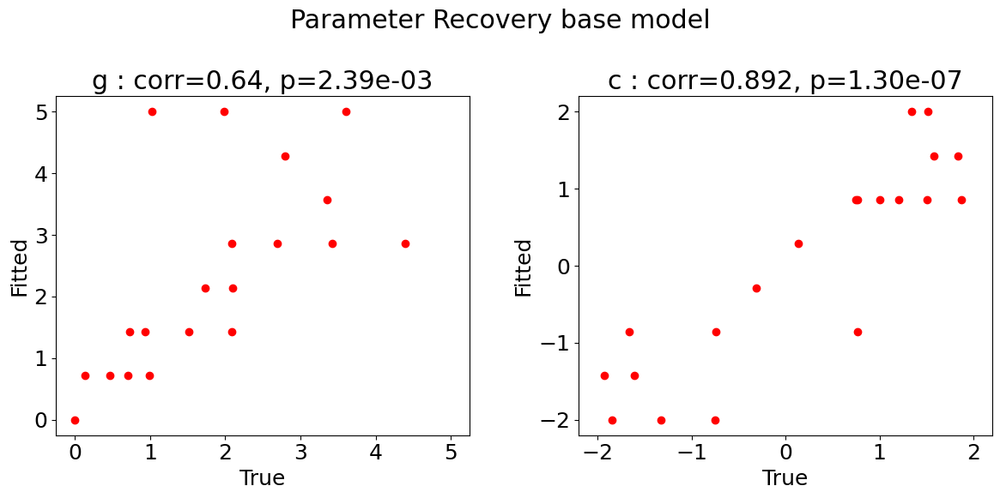

Saved to results/true_fitted_corr_base.png


In [ ]:
# plot the true to fitted parameters correlation for base model
fig, axs = plt.subplots(1, 2, figsize=(12, 6))  # Adjust the figsize as needed
axs = axs.ravel()
fig.suptitle('Parameter Recovery base model', fontweight='bold')

# set some margine to better see edge points
margin = 0.05

plot_true_fitted_correlation(to_recover_g, fitted_g_log_base, g_values, margin, axs[0])
axs[0].set_title(f'g : corr={inter_corr_base.loc["g", "correlation"]}, p={inter_corr_base.loc["g", "p-value"]}')

plot_true_fitted_correlation(to_recover_c, fitted_c_log_base, c_values, margin, axs[1])
axs[1].set_title(f'c : corr={inter_corr_base.loc["c", "correlation"]}, p={inter_corr_base.loc["c", "p-value"]}')

plt.tight_layout()
plt.show()
if SAVE_RESULTS:
    fig.savefig(f'{RESULTS_DIR}/true_fitted_corr_base.png')
    print(f"Saved to {RESULTS_DIR}/true_fitted_corr_base.png")

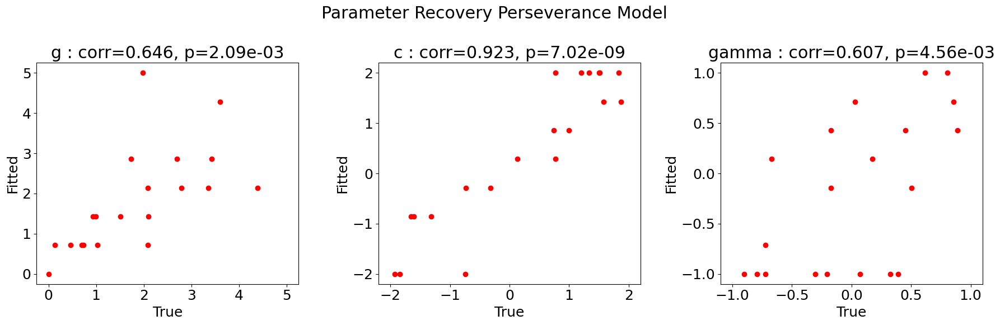

Saved to results/true_fitted_corr_P.png


In [ ]:
# plot the true to fitted parameters correlation for perseverence model
fig, axs = plt.subplots(1, 3, figsize=(18, 6))  # Adjust the figsize as needed
axs = axs.ravel()
fig.suptitle('Parameter Recovery Perseverance Model', fontweight='bold')

# set some margine to better see edge points
margin = 0.05

plot_true_fitted_correlation(to_recover_g, fitted_g_log_P, g_values, margin, axs[0])
axs[0].set_title(f'g : corr={inter_corr_P.loc["g", "correlation"]}, p={inter_corr_P.loc["g", "p-value"]}')

plot_true_fitted_correlation(to_recover_c, fitted_c_log_P, c_values, margin, axs[1])
axs[1].set_title(f'c : corr={inter_corr_P.loc["c", "correlation"]}, p={inter_corr_P.loc["c", "p-value"]}')

plot_true_fitted_correlation(to_recover_gamma, fitted_gamma_log_P, gamma_values, margin, axs[2])
axs[2].set_title(f'gamma : corr={inter_corr_P.loc["gamma", "correlation"]}, p={inter_corr_P.loc["gamma", "p-value"]}')

plt.tight_layout()
plt.show()
if SAVE_RESULTS:
    fig.savefig(f'{RESULTS_DIR}/true_fitted_corr_P.png')
    print(f"Saved to {RESULTS_DIR}/true_fitted_corr_P.png")

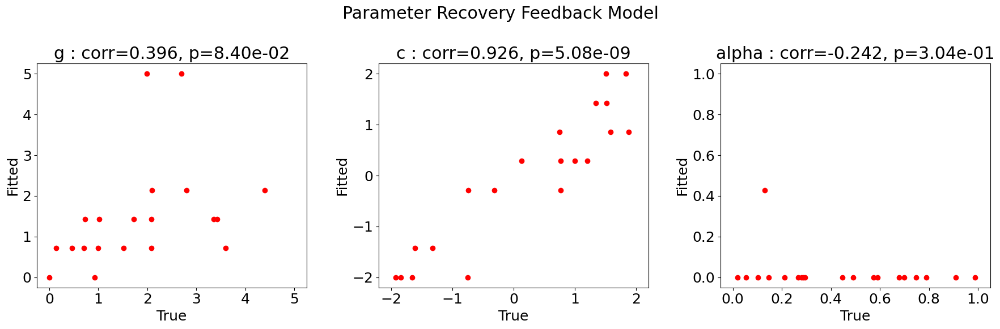

Saved to results/true_fitted_corr_F.png


In [ ]:
# plot the true to fitted parameters correlation for feedback model
fig, axs = plt.subplots(1, 3, figsize=(18, 6))  # Adjust the figsize as needed
axs = axs.ravel()
fig.suptitle('Parameter Recovery Feedback Model', fontweight='bold')

# set some margine to better see edge points
margin = 0.05

plot_true_fitted_correlation(to_recover_g, fitted_g_log_F, g_values, margin, axs[0])
axs[0].set_title(f'g : corr={inter_corr_F.loc["g", "correlation"]}, p={inter_corr_F.loc["g", "p-value"]}')

plot_true_fitted_correlation(to_recover_c, fitted_c_log_F, c_values, margin, axs[1])
axs[1].set_title(f'c : corr={inter_corr_F.loc["c", "correlation"]}, p={inter_corr_F.loc["c", "p-value"]}')

plot_true_fitted_correlation(to_recover_alpha, fitted_alpha_log_F, alpha_values, margin, axs[2])
axs[2].set_title(f'alpha : corr={inter_corr_F.loc["alpha", "correlation"]}, p={inter_corr_F.loc["alpha", "p-value"]}')


plt.tight_layout()
plt.show()
if SAVE_RESULTS:
    fig.savefig(f'{RESULTS_DIR}/true_fitted_corr_F.png')
    print(f"Saved to {RESULTS_DIR}/true_fitted_corr_F.png")

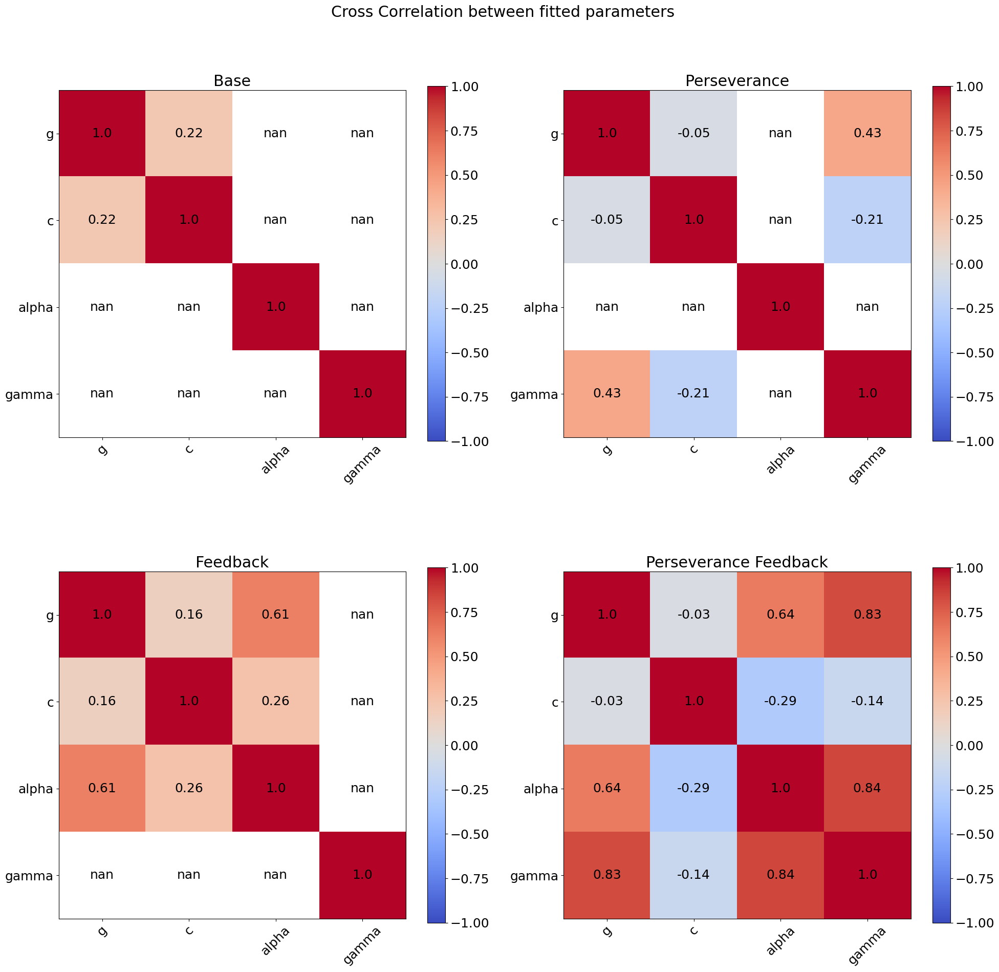

Saved to results/cross_corr.png


In [ ]:
# plot cross correlation between the fitted parameters for both models
fig, axs = plt.subplots(2, 2, figsize=(20, 20))  # Adjust the figsize as needed
axs = axs.ravel()
fig.suptitle('Cross Correlation between fitted parameters', fontweight='bold')

# base model
plot_cross_correlation(cross_corr_base, param_names, ax=axs[0])
axs[0].set_title('Base')

# perseverence model
plot_cross_correlation(cross_corr_P, param_names, ax=axs[1])
axs[1].set_title('Perseverance')

# feedback model
plot_cross_correlation(cross_corr_F, param_names, ax=axs[2])
axs[2].set_title('Feedback')

# perseverence feedback model
plot_cross_correlation(cross_corr_PF, param_names, ax=axs[3])
axs[3].set_title('Perseverance Feedback')

plt.tight_layout()
plt.show()
if SAVE_RESULTS:
    fig.savefig(f'{RESULTS_DIR}/cross_corr.png')
    print(f"Saved to {RESULTS_DIR}/cross_corr.png")

## *Optional*: Model Recovery *(2 bonus points)*

In this bonus exercise, you may examine model reovery. The bonus points count towards your total group project points. That is, you may accumlate up to 22 points in the practical part of the group project.

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [47]:
from model_recovery import model_recovery, plot_model_recovery

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [48]:
# Model Recovery
np.random.seed(1)
# Number of true values we seek to simulate and num of search values
num_runs = 10
num_samples = 6
# pick which models to include for the model recovery
model_names = ['base', 'perseverance', 'feedback', 'PF']

num_models = len(model_names)
num_true_parameters_samples = num_runs * num_models
# Experiment parameters
num_trials = 100
# hyperparameters
T = 2
sigma = 0.2
tau_P = 2/T
x_0 = np.array([0.5, 0.5, 0])

# Range of simulated and tested values for c, g, alpha, gamma
min_g, max_g = 0, 5
min_c, max_c = -2, 2
min_alpha, max_alpha = 0.0, 1.0
min_gamma, max_gamma = -1, 1

# Determine range of parameters for fitting
g_values = np.linspace(min_g, max_g, num_samples)
c_values = np.linspace(min_c, max_c, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)

# sampled parameters sets/combinations for the models
# first num_runs are for the base model, next num_runs for the perseverance model, and last num_runs for the perseverance feedback model
sampled_g = np.random.uniform(min_g, max_g, num_models*num_runs)
sampled_c = np.random.uniform(min_c, max_c, num_models*num_runs)
sampled_alpha = np.random.uniform(min_alpha, max_alpha, num_models*num_runs)
sampled_gamma = np.random.uniform(min_gamma, max_gamma, num_models*num_runs)

sampled_alpha[:2*num_runs] = 0  # set alpha to 0 for the base and perseverance model
sampled_gamma[:num_runs] = 0    # set gamma to 0 for the base model

print("number of total model fitting runs: ", num_true_parameters_samples)
print("number of total parameter fitting runs: ", num_true_parameters_samples*num_models)

number of total model fitting runs:  40
number of total parameter fitting runs:  160


In [49]:
confusion_matrix, inverse_matrix, true_fitted_df = model_recovery(num_trials, T, x_0, sampled_g, sampled_c, sampled_alpha, sampled_gamma,
                                                    g_values, c_values, alpha_values, gamma_values, sigma, tau_P, model_names=model_names)

run:   0%|          | 0/10 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

/home/mj/Documents/Esma/MiCNS/DynamicalSystemsModelling_TS/model_recovery.py:98: RuntimeWarning: invalid value encountered in divide
  inverse_matrix = best_fit_matrix / np.sum(best_fit_matrix, axis=1, keepdims=True)


In [50]:
display(true_fitted_df)
if SAVE_RESULTS:
    true_fitted_df.to_csv(f'{RESULTS_DIR}/model_recovery_results.csv')
    print(f"Saved to {RESULTS_DIR}/model_recovery_results.csv")

,true_model,fitted_model
0,base,base
1,perseverance,PF
2,feedback,PF
3,PF,base
4,base,base
5,perseverance,perseverance
6,feedback,base
7,PF,PF
8,base,PF
9,perseverance,PF


Saved to results/model_recovery_results.csv


In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ctypes import ArgumentError
from tqdm.notebook import tqdm

from model_simulation import simulate_experiment
from parameter_fitting import param_fit_grid_search_parallel
from model_comparison import model_fit, BIC


def model_recovery(
    num_trials,
    T,
    x_0,
    sampled_g,
    sampled_c,
    sampled_alpha,
    sampled_gamma,
    g_values,
    c_values,
    alpha_values,
    gamma_values,
    sigma=0.2,
    tau_P=1,
    model_names=["base", "perseverance", "feedback", "PF"],
):

    num_true_param_set = len(sampled_g)
    num_models = len(model_names)
    if (
        len(sampled_c) != num_true_param_set
        or len(sampled_alpha) != num_true_param_set
        or len(sampled_gamma) != num_true_param_set
    ):
        raise ArgumentError(
            "you have to give the same amount of values for all parameters to recover (g, c, alpha, gamma)"
        )

    # section the sampled parameters into num_models
    len_equal_shares = num_true_param_set - num_true_param_set % num_models
    num_runs = len_equal_shares // num_models

    models_g = np.array_split(sampled_g[:len_equal_shares], num_models)
    models_c = np.array_split(sampled_c[:len_equal_shares], num_models)
    modes_alpha = np.array_split(sampled_alpha[:len_equal_shares], num_models)
    models_gamma = np.array_split(sampled_gamma[:len_equal_shares], num_models)

    # array for logging true and fitted models
    true_model = np.zeros(num_runs * num_models, dtype=int)
    fitted_model = np.zeros(num_runs * num_models, dtype=int)

    for run in tqdm(range(num_runs), total=num_runs, desc="run", leave=True, position=0):
        # simulate data with the sampled parameters and attempt to fit those data
        for model in range(num_models):
            true_g = models_g[model][run]
            true_c = models_c[model][run]
            true_alpha = modes_alpha[model][run]
            true_gamma = models_gamma[model][run]

            # simulate data
            df = simulate_experiment(num_trials, T, x_0, true_g, true_c, true_alpha, true_gamma, sigma, tau_P)

            # fit all models to the data
            BIC_values = []
            if "base" in model_names:
                _, LL_base, _ = param_fit_grid_search_parallel(
                    df, T, x_0, g_values, c_values, np.zeros(1), np.zeros(1), sigma, tau_P
                )
                BIC_values.append(BIC(LL_base, 2, num_trials))
            if "perseverance" in model_names:
                _, LL_P, _ = param_fit_grid_search_parallel(
                    df, T, x_0, g_values, c_values, np.zeros(1), gamma_values, sigma, tau_P
                )
                BIC_values.append(BIC(LL_P, 3, num_trials))
            if "feedback" in model_names:
                _, LL_F, _ = param_fit_grid_search_parallel(
                    df, T, x_0, g_values, c_values, alpha_values, np.zeros(1), sigma, tau_P
                )
                BIC_values.append(BIC(LL_F, 3, num_trials))
            if "PF" in model_names:
                _, LL_PF, _ = param_fit_grid_search_parallel(
                    df, T, x_0, g_values, c_values, alpha_values, gamma_values, sigma, tau_P
                )
                BIC_values.append(BIC(LL_PF, 4, num_trials))

            BIC_values = np.array(BIC_values)

            # log the true and fitted models
            true_model[model + num_models * run] = model
            fitted_model[model + num_models * run] = np.argmin(BIC_values)

    best_fit_matrix = np.zeros((num_models, num_models))
    for true, fit in zip(true_model, fitted_model):
        best_fit_matrix[int(true), int(fit)] += 1
    best_fit_matrix = best_fit_matrix.T  # transpose to get true at columns and fitted at rows
    confusion_matrix = best_fit_matrix / np.sum(best_fit_matrix, axis=0)
    inverse_matrix = best_fit_matrix / np.sum(best_fit_matrix, axis=1, keepdims=True)

    # replace the ids of the models in the true and fitted model arrays with the actual model ids passed in models
    true_model = np.array([model_names[model] for model in true_model])
    fitted_model = np.array([model_names[model] for model in fitted_model])
    # df of true and fitted models
    true_fitted_df = pd.DataFrame({"true_model": true_model, "fitted_model": fitted_model})

    return confusion_matrix, inverse_matrix, true_fitted_df


def plot_model_recovery(confusion_matrix, inverse_matrix, model_names, axs=None):
    show_plot = False
    if axs is None:
        fig, axs = plt.subplots(1, 2, figsize=(10, 5))
        show_plot = True

    num_models = len(model_names)
    axs[0].imshow(confusion_matrix, cmap="viridis", vmin=0, vmax=1)
    axs[0].set_title("Confusion matrix")
    axs[0].set_xlabel("True model")
    axs[0].set_ylabel("Fitted model")
    axs[0].set_xticks(range(num_models))
    axs[0].set_xticklabels(model_names, rotation=45)
    axs[0].set_yticks(range(num_models))
    axs[0].set_yticklabels(model_names, rotation=45)
    # show the the actual values
    for i in range(num_models):
        for j in range(num_models):
            axs[0].text(j, i, f"{confusion_matrix[i, j]:.2f}", ha="center", va="center", color="black")

    im = axs[1].imshow(inverse_matrix, cmap="viridis", vmin=0, vmax=1)
    axs[1].set_title("Inversion matrix")
    axs[1].set_xlabel("True model")
    # axs[1].set_ylabel("Fitted model")
    axs[1].set_xticks(range(num_models))
    axs[1].set_xticklabels(model_names, rotation=45)
    axs[1].set_yticks(range(num_models))
    axs[1].set_yticklabels(model_names, rotation=45)
    for i in range(num_models):
        for j in range(num_models):
            axs[1].text(j, i, f"{inverse_matrix[i, j]:.2f}", ha="center", va="center", color="black")

    # add colorbar 0-1 to each ax TODO 

    if show_plot:
        plt.draw()

    return axs


/tmp/ipykernel_185124/2001498085.py:6: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


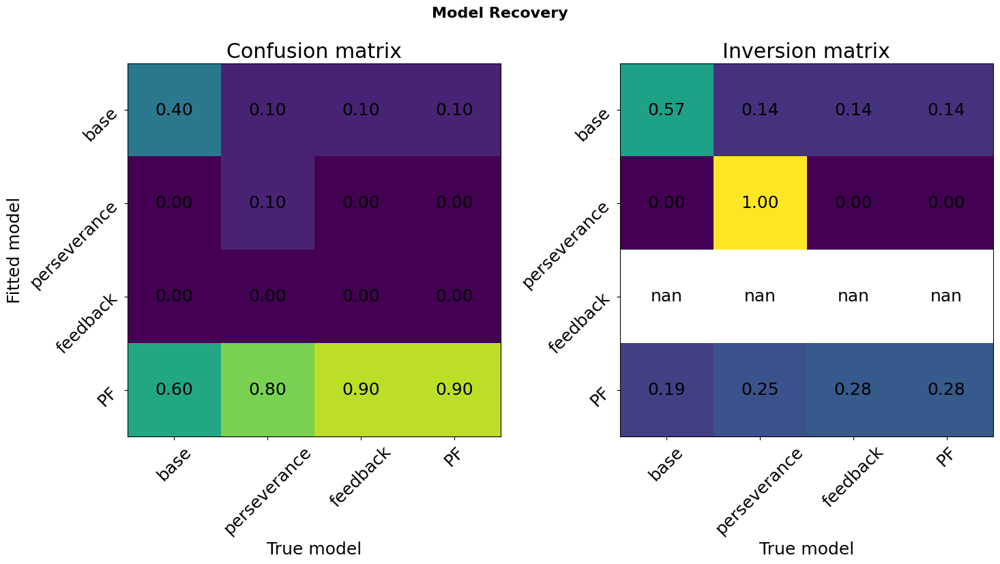

Saved to results/model_recovery.png


In [84]:
fig, axs = plt.subplots(1, 2, figsize=(15, 8), constrained_layout=True)
axs = axs.ravel()
fig.suptitle('Model Recovery', fontsize=16, y=1.0, fontweight='bold')
plot_model_recovery(confusion_matrix, inverse_matrix, model_names, axs=axs)

plt.tight_layout()
plt.show()

if SAVE_RESULTS:
    fig.savefig(f'{RESULTS_DIR}/model_recovery.png')
    print(f"Saved to {RESULTS_DIR}/model_recovery.png")

## Model Comparison *(5 points)*

For this exercise you should:

*   Load and (potentially) preprocess the experimental data. (1 point)

*   Fit the two models to the data.  *(1 point)*

*   Evaluate which model performs better, taking into account fit and model complexity. *(2 points)*

*   Plot the behavior of the winning model against the data. *(1 point)**

Make sure to comment your code and provide an explanation for each code block in a preceding text block.





In [173]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import json
import random
from tqdm.notebook import tqdm

from model_comparison import model_fit, model_comparision_results_statistics
from data_cleaning import clean_data
from analysis import *
from model_simulation import simulate_experiment
import model

SAVE_RESULTS = True
RESULTS_DIR = "results"
os.makedirs(RESULTS_DIR, exist_ok=True)

In [174]:
reset_cleaned_data = False # set to True to delete all cleaned in cleaned_data_dir and re-process the raw data

raw_data_dir = 'data'
cleaned_data_dir = 'data_cleaned'

# check if both directories exist, create them if they don't
os.makedirs(raw_data_dir, exist_ok=True)
os.makedirs(cleaned_data_dir, exist_ok=True)

if reset_cleaned_data:
    # remove all files in the cleaned_data_dir ending with .csv
    files = glob.glob(os.path.join(cleaned_data_dir, '*.csv'))
    for f in files:
        os.remove(f)

# check the number of .jsin files in the raw_data_dir and .csv files in the cleaned_data_dir
raw_data_names = glob.glob(os.path.join(raw_data_dir, '*.json'))
cleaned_data_names = glob.glob(os.path.join(cleaned_data_dir, '*.csv'))

num_raw_data_files = len(raw_data_names)
num_cleaned_data_files = len(cleaned_data_names)

print(f'number of raw data files: {num_raw_data_files}')
print(f'number of cleaned data files: {num_cleaned_data_files}')

# list of data files that are in the raw data directory but not in the cleaned data directory
data_files_to_clean = [file for file in raw_data_names if os.path.basename(file).replace('.json', '.csv') not in cleaned_data_names]
print("data to clean: ", *data_files_to_clean, sep='\n')
# clean raw data files
for data_file in data_files_to_clean:
    with open(data_file, "r") as f:
        data = json.load(f)
    # save to csv only if the data is not already saved
    if not os.path.exists(os.path.join(cleaned_data_dir, os.path.basename(data_file).replace('.json', '.csv'))):
        df_raw = pd.json_normalize(data)
        df_clean = clean_data(df_raw) 
        df_clean.to_csv(os.path.join(cleaned_data_dir, os.path.basename(data_file).replace('.json', '.csv')), index=False)

# get the names of the cleaned data files again after possible upadting
cleaned_data_names = glob.glob(os.path.join(cleaned_data_dir, '*.csv'))
print(f'updated number of cleaned data files: {len(cleaned_data_names)}')
print("file names: ", *cleaned_data_names, sep='\n')
# load the cleaned data into dataframes
data_dfs = [pd.read_csv(data_file) for data_file in cleaned_data_names]

if len(data_dfs) == 0:
    raise ValueError("No data to fit the models")

number of raw data files: 16
number of cleaned data files: 16
data to clean: 
data/example Val.json
data/example_eg.json
data/example_dn.json
data/Hendrik Data.json
data/example andr.json
data/example.json
data/example Alex4.json
data/example Alex1.json
data/Sophie.json
data/example Alex3.json
data/example_s.json
data/MaybeLudo.json
data/example Alex2.json
data/AnyonesGuessButMaybeSammy.json
data/Yehore data.json
data/Esma.json
updated number of cleaned data files: 16
file names: 
data_cleaned/example Alex3.csv
data_cleaned/example_dn.csv
data_cleaned/Yehore data.csv
data_cleaned/example Alex2.csv
data_cleaned/example_s.csv
data_cleaned/MaybeLudo.csv
data_cleaned/example Val.csv
data_cleaned/Hendrik Data.csv
data_cleaned/example_eg.csv
data_cleaned/AnyonesGuessButMaybeSammy.csv
data_cleaned/example.csv
data_cleaned/example Alex4.csv
data_cleaned/Sophie.csv
data_cleaned/example andr.csv
data_cleaned/example Alex1.csv
data_cleaned/Esma.csv


In [ ]:
# Parameter Fitting Setup
num_samples = 8

seed = 40
random.seed(seed)

# Experiment parameters
num_trials = 100
# hyperparameters
model.FEEDBACK_INFLUENCE = 'indirect'
T = 2
sigma = 0.2
tau_P = 2/T
x_0 = [0.5, 0.5, 0]

# Search space over parameters
min_g, max_g = 0, 5
min_c, max_c = -2, 2
min_alpha, max_alpha = 0.0, 1.0
min_gamma, max_gamma = -1, 1

c_values = np.linspace(min_c, max_c, num_samples)
g_values = np.linspace(min_g, max_g, num_samples)
alpha_values = np.linspace(min_alpha, max_alpha, num_samples)
gamma_values = np.linspace(min_gamma, max_gamma, num_samples)


# Initialize a dictionary to store the best-fitting parameters for each participant
participant_results = {}

# Initialize counters for the best fit model
model_names = ['base', 'perseverance', 'feedback', 'PF']
best_model_fit_counts = {model: 0 for model in model_names}

# Loop through each CSV file (each participant's data)
for idx, data in tqdm(enumerate(data_dfs), total=len(data_dfs), desc='participants', leave=True):
    print(f"\nProcessing participant {idx + 1}: {cleaned_data_names[idx]}")

    acc_consecutive = model_fit(data, T, x_0, g_values, c_values, alpha_values, gamma_values, sigma, tau_P, model_names)
    
    # Store the results in the dictionary
    # results is a dictoinary of the form: model_XX: {g: value, c: value, alpha: value, gamma: value, LL: value, BIC: value}
    participant_results[f"participant_{idx + 1}"] = acc_consecutive

    # determine which model has the lowest BIC for the current participant
    best_model = min(acc_consecutive, key=lambda x: acc_consecutive[x]['BIC'])
    best_model_fit_counts[best_model] += 1

    # Print the results for the current participant
    print(f"Participant {idx + 1} Results:")
    for model, params in acc_consecutive.items():
        print(f"{model}: {params}")
    print(f"Best Fit Model: {best_model}, BIC: {acc_consecutive[best_model]['BIC']}")
    # count best fit model sofar
    print(f"Best Fit Counts: {best_model_fit_counts}")

participants:   0%|          | 0/16 [00:00<?, ?it/s]


Processing participant 1: data_cleaned/example Alex3.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  74


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 1 Results:
base: {'g': 0.7142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -50.7161539738539, 'BIC': 110.04043813411614}
perseverance: {'g': 0.7142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': -1.0, 'LL': -49.12776999957211, 'BIC': 111.16773527875674}
feedback: {'g': 0.7142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -50.5201554538129, 'BIC': 113.9525061872383}
PF: {'g': 1.4285714285714286, 'c': 0.2857142857142856, 'alpha': 0.5714285714285714, 'gamma': -1.0, 'LL': -38.63491273943309, 'BIC': 94.48608585168286}
Best Fit Model: PF, BIC: 94.48608585168286
Best Fit Counts: {'base': 0, 'perseverance': 0, 'feedback': 0, 'PF': 1}

Processing participant 2: data_cleaned/example_dn.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  99


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 2 Results:
base: {'g': 2.142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -25.69980780651834, 'BIC': 60.58985531330586}
perseverance: {'g': 2.857142857142857, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': -0.1428571428571429, 'LL': -25.18776185035579, 'BIC': 64.16088325111535}
feedback: {'g': 2.857142857142857, 'c': 0.2857142857142856, 'alpha': 0.14285714285714285, 'gamma': 0.0, 'LL': -25.760577828555416, 'BIC': 65.3065152075146}
PF: {'g': 3.5714285714285716, 'c': 0.2857142857142856, 'alpha': 0.5714285714285714, 'gamma': -1.0, 'LL': -18.9320878886967, 'BIC': 56.24465517793176}
Best Fit Model: PF, BIC: 56.24465517793176
Best Fit Counts: {'base': 0, 'perseverance': 0, 'feedback': 0, 'PF': 2}

Processing participant 3: data_cleaned/Yehore data.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  98


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 3 Results:
base: {'g': 3.5714285714285716, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -18.964241236654598, 'BIC': 47.09841743065034}
perseverance: {'g': 3.5714285714285716, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': -0.1428571428571429, 'LL': -18.695601442886815, 'BIC': 51.14610532178535}
feedback: {'g': 3.5714285714285716, 'c': 0.2857142857142856, 'alpha': 0.14285714285714285, 'gamma': 0.0, 'LL': -18.602227775512212, 'BIC': 50.95935798703614}
PF: {'g': 5.0, 'c': 0.2857142857142856, 'alpha': 1.0, 'gamma': 1.0, 'LL': -10.585769100902194, 'BIC': 39.51140811648668}
Best Fit Model: PF, BIC: 39.51140811648668
Best Fit Counts: {'base': 0, 'perseverance': 0, 'feedback': 0, 'PF': 3}

Processing participant 4: data_cleaned/example Alex2.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  94


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 4 Results:
base: {'g': 2.142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -31.21205645976914, 'BIC': 71.5107024840783}
perseverance: {'g': 2.142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.1428571428571428, 'LL': -30.843614962354813, 'BIC': 75.31711427151964}
feedback: {'g': 5.0, 'c': 0.2857142857142856, 'alpha': 0.42857142857142855, 'gamma': 0.0, 'LL': -31.53532971408762, 'BIC': 76.70054377498525}
PF: {'g': 4.285714285714286, 'c': 0.2857142857142856, 'alpha': 0.8571428571428571, 'gamma': 0.7142857142857142, 'LL': -24.092548109614903, 'BIC': 66.35827534830982}
Best Fit Model: PF, BIC: 66.35827534830982
Best Fit Counts: {'base': 0, 'perseverance': 0, 'feedback': 0, 'PF': 4}

Processing participant 5: data_cleaned/example_s.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  92


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 5 Results:
base: {'g': 0.7142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -52.57565634344744, 'BIC': 114.19488984099297}
perseverance: {'g': 0.7142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.7142857142857142, 'LL': -51.69999530726616, 'BIC': 116.96535634567944}
feedback: {'g': 0.7142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -52.60083765396816, 'BIC': 118.76704103908345}
PF: {'g': 1.4285714285714286, 'c': 0.2857142857142856, 'alpha': 0.42857142857142855, 'gamma': -1.0, 'LL': -42.28553193623458, 'BIC': 102.65821818066532}
Best Fit Model: PF, BIC: 102.65821818066532
Best Fit Counts: {'base': 0, 'perseverance': 0, 'feedback': 0, 'PF': 5}

Processing participant 6: data_cleaned/MaybeLudo.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  98


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 6 Results:
base: {'g': 5.0, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -22.695397095338052, 'BIC': 54.560729148017245}
perseverance: {'g': 5.0, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': -1.0, 'LL': -19.770581253195534, 'BIC': 53.296064942402786}
feedback: {'g': 5.0, 'c': 0.2857142857142856, 'alpha': 0.14285714285714285, 'gamma': 0.0, 'LL': -22.58115819451563, 'BIC': 58.91721882504298}
PF: {'g': 4.285714285714286, 'c': 0.2857142857142856, 'alpha': 0.5714285714285714, 'gamma': -1.0, 'LL': -13.812052212244899, 'BIC': 45.96397433917208}
Best Fit Model: PF, BIC: 45.96397433917208
Best Fit Counts: {'base': 0, 'perseverance': 0, 'feedback': 0, 'PF': 6}

Processing participant 7: data_cleaned/example Val.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  96


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 7 Results:
base: {'g': 4.285714285714286, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -16.796958706449548, 'BIC': 42.72261379583477}
perseverance: {'g': 5.0, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': -0.7142857142857143, 'LL': -16.37108894802109, 'BIC': 46.43522247044569}
feedback: {'g': 5.0, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -16.684668122192555, 'BIC': 47.06238081878862}
PF: {'g': 4.285714285714286, 'c': 0.2857142857142856, 'alpha': 0.5714285714285714, 'gamma': -1.0, 'LL': -12.40282683212764, 'BIC': 43.063046430126626}
Best Fit Model: base, BIC: 42.72261379583477
Best Fit Counts: {'base': 1, 'perseverance': 0, 'feedback': 0, 'PF': 6}

Processing participant 8: data_cleaned/Hendrik Data.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  93


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 8 Results:
base: {'g': 2.142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -32.6306501283756, 'BIC': 74.32649924305771}
perseverance: {'g': 2.142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': -0.4285714285714286, 'LL': -30.577766680186077, 'BIC': 74.75333183983193}
feedback: {'g': 1.4285714285714286, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -32.77335176858409, 'BIC': 79.14450201662795}
PF: {'g': 2.857142857142857, 'c': 0.2857142857142856, 'alpha': 0.5714285714285714, 'gamma': -1.0, 'LL': -21.507099620744768, 'BIC': 61.14459721410256}
Best Fit Model: PF, BIC: 61.14459721410256
Best Fit Counts: {'base': 1, 'perseverance': 0, 'feedback': 0, 'PF': 7}

Processing participant 9: data_cleaned/example_eg.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  97


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 9 Results:
base: {'g': 2.857142857142857, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -23.20210959098491, 'BIC': 55.55364113897659}
perseverance: {'g': 2.857142857142857, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': -0.4285714285714286, 'LL': -22.746620963475856, 'BIC': 59.21737486246186}
feedback: {'g': 2.857142857142857, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -23.263364767460445, 'BIC': 60.25086247043104}
PF: {'g': 4.285714285714286, 'c': 0.2857142857142856, 'alpha': 0.5714285714285714, 'gamma': -1.0, 'LL': -17.040308073404592, 'BIC': 52.379460060822716}
Best Fit Model: PF, BIC: 52.379460060822716
Best Fit Counts: {'base': 1, 'perseverance': 0, 'feedback': 0, 'PF': 8}

Processing participant 10: data_cleaned/AnyonesGuessButMaybeSammy.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  99


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 10 Results:
base: {'g': 4.285714285714286, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -13.80112581581675, 'BIC': 36.79249133190268}
perseverance: {'g': 5.0, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.1428571428571428, 'LL': -14.243475467526375, 'BIC': 42.272310485456515}
feedback: {'g': 4.285714285714286, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -13.734837844545465, 'BIC': 41.2550352394947}
PF: {'g': 5.0, 'c': 0.8571428571428568, 'alpha': 0.8571428571428571, 'gamma': 1.0, 'LL': -3.4376068388181893, 'BIC': 25.255693078174737}
Best Fit Model: PF, BIC: 25.255693078174737
Best Fit Counts: {'base': 1, 'perseverance': 0, 'feedback': 0, 'PF': 9}

Processing participant 11: data_cleaned/example.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  93


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 11 Results:
base: {'g': 2.142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -32.66341749608683, 'BIC': 74.39203397848017}
perseverance: {'g': 2.857142857142857, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': -0.7142857142857143, 'LL': -30.452994081487542, 'BIC': 74.50378664243485}
feedback: {'g': 2.142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -33.20080732528793, 'BIC': 79.99941313003563}
PF: {'g': 3.5714285714285716, 'c': 0.2857142857142856, 'alpha': 0.42857142857142855, 'gamma': -1.0, 'LL': -21.374954551079213, 'BIC': 60.88030707477145}
Best Fit Model: PF, BIC: 60.88030707477145
Best Fit Counts: {'base': 1, 'perseverance': 0, 'feedback': 0, 'PF': 10}

Processing participant 12: data_cleaned/example Alex4.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  97


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 12 Results:
base: {'g': 1.4285714285714286, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -52.86522060709741, 'BIC': 114.87986317120159}
perseverance: {'g': 1.4285714285714286, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': -1.0, 'LL': -49.643949823194006, 'BIC': 113.01203258189815}
feedback: {'g': 0.7142857142857143, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -53.047005191281855, 'BIC': 119.81814331807385}
PF: {'g': 2.142857142857143, 'c': 0.2857142857142856, 'alpha': 0.5714285714285714, 'gamma': -1.0, 'LL': -35.56549543117556, 'BIC': 89.42983477636466}
Best Fit Model: PF, BIC: 89.42983477636466
Best Fit Counts: {'base': 1, 'perseverance': 0, 'feedback': 0, 'PF': 11}

Processing participant 13: data_cleaned/Sophie.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  97


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 13 Results:
base: {'g': 2.857142857142857, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -22.968161398891308, 'BIC': 55.08574475478938}
perseverance: {'g': 2.857142857142857, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.1428571428571428, 'LL': -21.760410663697385, 'BIC': 57.24495426290492}
feedback: {'g': 2.857142857142857, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -22.97153833728056, 'BIC': 59.66720961007127}
PF: {'g': 4.285714285714286, 'c': 2.0, 'alpha': 0.8571428571428571, 'gamma': 1.0, 'LL': -6.030127890138293, 'BIC': 30.359099694290116}
Best Fit Model: PF, BIC: 30.359099694290116
Best Fit Counts: {'base': 1, 'perseverance': 0, 'feedback': 0, 'PF': 12}

Processing participant 14: data_cleaned/example andr.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  97


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 14 Results:
base: {'g': 5.0, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': 0.0, 'LL': -17.14104170794501, 'BIC': 43.43150537289679}
perseverance: {'g': 5.0, 'c': 0.2857142857142856, 'alpha': 0.0, 'gamma': -0.7142857142857143, 'LL': -15.41891467945283, 'BIC': 44.56196229441581}
feedback: {'g': 5.0, 'c': 0.2857142857142856, 'alpha': 0.2857142857142857, 'gamma': 0.0, 'LL': -16.666129428855285, 'BIC': 47.05639179322072}
PF: {'g': 4.285714285714286, 'c': 0.2857142857142856, 'alpha': 0.5714285714285714, 'gamma': -1.0, 'LL': -10.891527571570816, 'BIC': 40.08189905715516}
Best Fit Model: PF, BIC: 40.08189905715516
Best Fit Counts: {'base': 1, 'perseverance': 0, 'feedback': 0, 'PF': 13}

Processing participant 15: data_cleaned/example Alex1.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  99


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 15 Results:
base: {'g': 5.0, 'c': -0.2857142857142858, 'alpha': 0.0, 'gamma': 0.0, 'LL': -46.4922172164246, 'BIC': 102.17467413311837}
perseverance: {'g': 4.285714285714286, 'c': -0.2857142857142858, 'alpha': 0.0, 'gamma': -0.4285714285714286, 'LL': -45.64013134932686, 'BIC': 105.06562224905748}
feedback: {'g': 5.0, 'c': -0.2857142857142858, 'alpha': 0.0, 'gamma': 0.0, 'LL': -46.52755552197086, 'BIC': 106.84047059434549}
PF: {'g': 2.142857142857143, 'c': 0.2857142857142856, 'alpha': 0.42857142857142855, 'gamma': -1.0, 'LL': -34.21186998102646, 'BIC': 86.80421936259128}
Best Fit Model: PF, BIC: 86.80421936259128
Best Fit Counts: {'base': 1, 'perseverance': 0, 'feedback': 0, 'PF': 14}

Processing participant 16: data_cleaned/Esma.csv
fitting data to models:  ['base', 'perseverance', 'feedback', 'PF']
number of data points:  98


Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Parallel Grid Search:   0%|          | 0/16 [00:00<?, ?it/s]

Participant 16 Results:
base: {'g': 1.4285714285714286, 'c': -0.2857142857142858, 'alpha': 0.0, 'gamma': 0.0, 'LL': -61.89615995947024, 'BIC': 132.96225487628163}
perseverance: {'g': 1.4285714285714286, 'c': -0.2857142857142858, 'alpha': 0.0, 'gamma': 0.4285714285714284, 'LL': -61.507945427870865, 'BIC': 136.77079329175345}
feedback: {'g': 1.4285714285714286, 'c': -0.2857142857142858, 'alpha': 0.0, 'gamma': 0.0, 'LL': -61.96435162019138, 'BIC': 137.68360567639448}
PF: {'g': 1.4285714285714286, 'c': 0.2857142857142856, 'alpha': 0.5714285714285714, 'gamma': -1.0, 'LL': -48.20350587287099, 'BIC': 114.74688166042426}
Best Fit Model: PF, BIC: 114.74688166042426
Best Fit Counts: {'base': 1, 'perseverance': 0, 'feedback': 0, 'PF': 15}


In [ ]:
# make a dataframe out of the participant_results
results_df = pd.DataFrame(columns=[f"{model}_{param}" for model in model_names for param in ['g', 'c', 'alpha', 'gamma', 'LL', 'BIC']])
for participant, acc_consecutive in participant_results.items():
    results_df.loc[participant] = [acc_consecutive[model][param] for model in model_names for param in ['g', 'c', 'alpha', 'gamma', 'LL', 'BIC']]

# round the values
results_df = results_df.astype(float).round(3)

# add a column for the name of the best model for each participant
results_df['best_model'] = results_df.apply(lambda x: model_names[np.argmin([x[f"{model}_BIC"] for model in model_names])], axis=1)

# reoder the columns
results_df = results_df[['best_model', 'base_BIC', 'perseverance_BIC', 'feedback_BIC', 'PF_BIC', 'base_LL', 'perseverance_LL', 'feedback_LL', 'PF_LL',
                            'base_g', 'base_c', 'base_alpha', 'base_gamma', 
                            'perseverance_g', 'perseverance_c', 'perseverance_alpha', 'perseverance_gamma',
                            'feedback_g', 'feedback_c', 'feedback_alpha', 'feedback_gamma',
                            'PF_g', 'PF_c', 'PF_alpha', 'PF_gamma']]

# df of of final counts
best_model_fit_counts_df = results_df['best_model'].value_counts().to_frame().T
best_model_fit_counts_df = best_model_fit_counts_df.reindex(columns=model_names, fill_value=0)

display(best_model_fit_counts_df)

display(results_df)
if SAVE_RESULTS:
    results_df.to_csv(f'{RESULTS_DIR}/model_fit_results.csv')
    print(f"Results saved to {RESULTS_DIR}/model_fit_results.csv")

best_model,base,perseverance,feedback,PF
count,1,0,0,15


,best_model,base_BIC,perseverance_BIC,feedback_BIC,PF_BIC,base_LL,perseverance_LL,feedback_LL,PF_LL,base_g,...,perseverance_alpha,perseverance_gamma,feedback_g,feedback_c,feedback_alpha,feedback_gamma,PF_g,PF_c,PF_alpha,PF_gamma
participant_1,PF,110.040,111.168,113.953,94.486,-50.716,-49.128,-50.520,-38.635,0.714,...,0.0,-1.000,0.714,0.286,0.000,0.0,1.429,0.286,0.571,-1.000
participant_2,PF,60.590,64.161,65.307,56.245,-25.700,-25.188,-25.761,-18.932,2.143,...,0.0,-0.143,2.857,0.286,0.143,0.0,3.571,0.286,0.571,-1.000
participant_3,PF,47.098,51.146,50.959,39.511,-18.964,-18.696,-18.602,-10.586,3.571,...,0.0,-0.143,3.571,0.286,0.143,0.0,5.000,0.286,1.000,1.000
participant_4,PF,71.511,75.317,76.701,66.358,-31.212,-30.844,-31.535,-24.093,2.143,...,0.0,0.143,5.000,0.286,0.429,0.0,4.286,0.286,0.857,0.714
participant_5,PF,114.195,116.965,118.767,102.658,-52.576,-51.700,-52.601,-42.286,0.714,...,0.0,0.714,0.714,0.286,0.000,0.0,1.429,0.286,0.429,-1.000
participant_6,PF,54.561,53.296,58.917,45.964,-22.695,-19.771,-22.581,-13.812,5.000,...,0.0,-1.000,5.000,0.286,0.143,0.0,4.286,0.286,0.571,-1.000
participant_7,base,42.723,46.435,47.062,43.063,-16.797,-16.371,-16.685,-12.403,4.286,...,0.0,-0.714,5.000,0.286,0.000,0.0,4.286,0.286,0.571,-1.000
participant_8,PF,74.326,74.753,79.145,61.145,-32.631,-30.578,-32.773,-21.507,2.143,...,0.0,-0.429,1.429,0.286,0.000,0.0,2.857,0.286,0.571,-1.000
participant_9,PF,55.554,59.217,60.251,52.379,-23.202,-22.747,-23.263,-17.040,2.857,...,0.0,-0.429,2.857,0.286,0.000,0.0,4.286,0.286,0.571,-1.000
participant_10,PF,36.792,42.272,41.255,25.256,-13.801,-14.243,-13.735,-3.438,4.286,...,0.0,0.143,4.286,0.286,0.000,0.0,5.000,0.857,0.857,1.000


Results saved to results/model_fit_results.csv


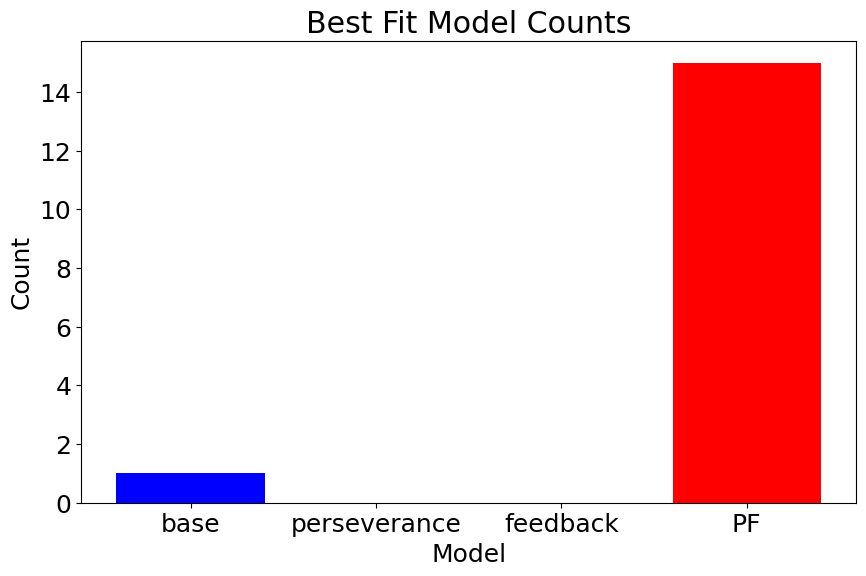

In [181]:
# for each model, plot the number of participants for which it was the best fit
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(best_model_fit_counts_df.columns, best_model_fit_counts_df.values[0], color=['blue', 'orange', 'green', 'red'], label='Best Fit Model Counts')
ax.set_title('Best Fit Model Counts')
ax.set_xlabel('Model')
ax.set_ylabel('Count')
plt.show()

In [ ]:
# a dataframe with the statistics of the results, here we keep the statistics of all the models beside the relevant ones to each model
summary_stats_all_df = model_comparision_results_statistics(results_df)

# keep only the best model statistics of each model
cols = ['LL', 'BIC', 'g', 'c', 'alpha', 'gamma']
stats = ['mean', 'std', 'se', 'ci_lower', 'ci_upper']
multi_cols = pd.MultiIndex.from_product([cols, stats])

summary_stats_fit_df = pd.DataFrame(columns=multi_cols, index=model_names)
# the dataframe has one raw for each model and the relevant statistics of that model
for model in model_names:
    if model in summary_stats_all_df.index:
        summary_stats_fit_df.loc[model, 'count'] = summary_stats_all_df.loc[model, ('count')].values[0]
        for stat in stats:
            for col_name in cols:
                summary_stats_fit_df.loc[model, (col_name, stat)] = summary_stats_all_df.loc[model, (f'{model}_{col_name}', stat)]
    else:
        summary_stats_fit_df.loc[model] = np.nan
        summary_stats_fit_df.loc[model, 'count'] = 0


display(summary_stats_all_df)
display(summary_stats_fit_df)

if SAVE_RESULTS:
    summary_stats_all_df.to_csv(f'{RESULTS_DIR}/model_comparison_stats_all.csv')
    summary_stats_fit_df.to_csv(f'{RESULTS_DIR}/model_comparison_stats_fit.csv')
    print(f"Results saved to {RESULTS_DIR}/model_comparison_stats_all.csv")
    print(f"Results saved to {RESULTS_DIR}/model_comparison_stats_fit.csv")

PF_BIC                                    PF_LL                   \
           ci_lower ci_upper    mean     se     std ci_lower ci_upper    mean   
best_model                                                                      
PF           50.553   78.287  64.420  7.075  27.401  -30.068  -16.146 -23.107   
base            NaN      NaN  43.063    NaN     NaN      NaN      NaN -12.403   

                           ... perseverance_g                       \
               se     std  ...       ci_upper   mean     se    std   
best_model                 ...                                       
PF          3.552  13.755  ...          3.605  2.857  0.382  1.479   
base          NaN     NaN  ...            NaN  5.000    NaN    NaN   

           perseverance_gamma                               count  
                     ci_lower ci_upper   mean     se    std        
best_model                                                         
PF                     -0.568   -0.023 -0.295  0.139  0.539    15  
base                      NaN      NaN -0.714    NaN    NaN     1  

[2 rows x 121 columns]

LL                                      BIC                 \
                mean     std     se ci_lower ci_upper    mean     std     se   
base         -16.797     NaN    NaN      NaN      NaN  42.723     NaN    NaN   
perseverance     NaN     NaN    NaN      NaN      NaN     NaN     NaN    NaN   
feedback         NaN     NaN    NaN      NaN      NaN     NaN     NaN    NaN   
PF           -23.107  13.755  3.552  -30.068  -16.146   64.42  27.401  7.075   

                                ...  alpha                           gamma  \
             ci_lower ci_upper  ...    std     se ci_lower ci_upper   mean   
base              NaN      NaN  ...    NaN    NaN      NaN      NaN    0.0   
perseverance      NaN      NaN  ...    NaN    NaN      NaN      NaN    NaN   
feedback          NaN      NaN  ...    NaN    NaN      NaN      NaN    NaN   
PF             50.553   78.287  ...  0.177  0.046    0.539    0.718 -0.486   

                                             count  
                std     se ci_lower ci_upper        
base            NaN    NaN      NaN      NaN   1.0  
perseverance    NaN    NaN      NaN      NaN   0.0  
feedback        NaN    NaN      NaN      NaN   0.0  
PF            0.885  0.229   -0.934   -0.038  15.0  

[4 rows x 31 columns]

In [ ]:
summary_stats_fit_measures_df = summary_stats_fit_df[['count', 'LL', 'BIC']].copy()
summary_stats_fit_params_df = summary_stats_fit_df[['count', 'g', 'c', 'alpha', 'gamma']].copy()

display(summary_stats_fit_measures_df)
display(summary_stats_fit_params_df)

if SAVE_RESULTS:
    summary_stats_fit_measures_df.to_csv(f'{RESULTS_DIR}/model_comparison_stats_fit_measures.csv')
    summary_stats_fit_params_df.to_csv(f'{RESULTS_DIR}/model_comparison_stats_fit_params.csv')
    # to latex
    summary_stats_fit_measures_df.to_latex(f'{RESULTS_DIR}/model_comparison_stats_fit_measures.tex')
    summary_stats_fit_params_df.to_latex(f'{RESULTS_DIR}/model_comparison_stats_fit_params.tex')
    print(f"Results saved to {RESULTS_DIR}/model_comparison_stats_fit_measures.csv")
    print(f"Results saved to {RESULTS_DIR}/model_comparison_stats_fit_params.csv")
    print(f"Results saved to {RESULTS_DIR}/model_comparison_stats_fit_measures.tex")
    print(f"Results saved to {RESULTS_DIR}/model_comparison_stats_fit_params.tex")

count      LL                                      BIC          \
                      mean     std     se ci_lower ci_upper    mean     std   
base           1.0 -16.797     NaN    NaN      NaN      NaN  42.723     NaN   
perseverance   0.0     NaN     NaN    NaN      NaN      NaN     NaN     NaN   
feedback       0.0     NaN     NaN    NaN      NaN      NaN     NaN     NaN   
PF            15.0 -23.107  13.755  3.552  -30.068  -16.146   64.42  27.401   

                                       
                 se ci_lower ci_upper  
base            NaN      NaN      NaN  
perseverance    NaN      NaN      NaN  
feedback        NaN      NaN      NaN  
PF            7.075   50.553   78.287

count      g                                      c         \
                     mean    std     se ci_lower ci_upper   mean    std   
base           1.0  4.286    NaN    NaN      NaN      NaN  0.286    NaN   
perseverance   0.0    NaN    NaN    NaN      NaN      NaN    NaN    NaN   
feedback       0.0    NaN    NaN    NaN      NaN      NaN    NaN    NaN   
PF            15.0  3.333  1.313  0.339    2.669    3.998  0.438  0.456   

                              ...  alpha                                  \
                 se ci_lower  ...   mean    std     se ci_lower ci_upper   
base            NaN      NaN  ...    0.0    NaN    NaN      NaN      NaN   
perseverance    NaN      NaN  ...    NaN    NaN    NaN      NaN      NaN   
feedback        NaN      NaN  ...    NaN    NaN    NaN      NaN      NaN   
PF            0.118    0.207  ...  0.628  0.177  0.046    0.539    0.718   

              gamma                                  
               mean    std     se ci_lower ci_upper  
base            0.0    NaN    NaN      NaN      NaN  
perseverance    NaN    NaN    NaN      NaN      NaN  
feedback        NaN    NaN    NaN      NaN      NaN  
PF           -0.486  0.885  0.229   -0.934   -0.038  

[4 rows x 21 columns]

,g,c,alpha,gamma
base,4.286,0.286,0.0,0.0
perseverance,NaN,NaN,NaN,NaN
feedback,NaN,NaN,NaN,NaN
PF,3.333,0.438,0.628,-0.486


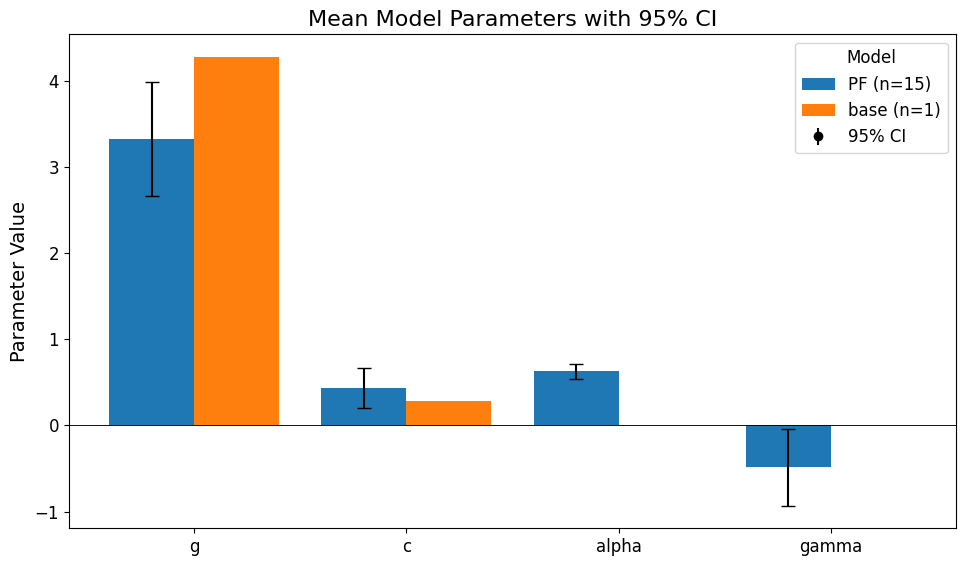

In [205]:
param_cols = ['g', 'c', 'alpha', 'gamma']

param_means = summary_stats_fit_df.loc[:, param_cols].xs('mean', axis=1, level=1)
param_ci_lower = summary_stats_fit_df.loc[:, param_cols].xs('ci_lower', axis=1, level=1)
param_ci_upper = summary_stats_fit_df.loc[:, param_cols].xs('ci_upper', axis=1, level=1)
param_errors = (param_ci_upper - param_ci_lower) / 2

display(param_means)
# Set up the plot.
models = summary_stats_all_df.index.tolist()
n_params = len(param_cols)
x = np.arange(n_params)   # positions for each parameter group on the x-axis
width = 0.8 / len(models)  # width for each model's bar

fig, ax = plt.subplots(figsize=(10, 6))
for i, model in enumerate(models):
    means = param_means.loc[model].values.astype(float)
    errors = param_errors.loc[model].values.astype(float)
    count = int(summary_stats_fit_df.loc[model, 'count'].iloc[0])
    # Include the count in the legend label.
    ax.bar(x + i * width, means, width, yerr=errors, capsize=5,
           label=f"{model} (n={count})")
    # add horizontal line at y=0
    ax.axhline(y=0, color='black', linewidth=0.5)

# Set x-ticks and labels.
ax.set_xticks(x + width * (len(models) - 1) / 2)
ax.set_xticklabels(param_cols, fontsize=12)
ax.set_ylabel("Parameter Value", fontsize=14)
ax.set_title("Mean Model Parameters with 95% CI", fontsize=16)

# Create a dummy errorbar for the legend to denote "95% CI".
dummy = ax.errorbar([], [], yerr=0, fmt='o', capsize=5, color='black')
handles, labels = ax.get_legend_handles_labels()
handles.append(dummy)
labels.append("95% CI")
ax.legend(handles, labels, title="Model", fontsize=12, title_fontsize=12)
ax.tick_params(axis="both", labelsize=12)
plt.tight_layout()
plt.show()

### plot behavior of the winning model against the data

/tmp/ipykernel_185124/1229402916.py:82: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  overall_block = data.groupby("block")["response"].mean().reset_index()
/tmp/ipykernel_185124/1229402916.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  switch_block = data[data["trial_type"] == "switch"].groupby("block")["response"].mean().reset_index()
/tmp/ipykernel_185124/1229402916.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warn

Best Model: PF, fitted 15 out of 16 participynts (93.75%)


/tmp/ipykernel_185124/1229402916.py:82: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  overall_block = data.groupby("block")["response"].mean().reset_index()
/tmp/ipykernel_185124/1229402916.py:83: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  switch_block = data[data["trial_type"] == "switch"].groupby("block")["response"].mean().reset_index()
/tmp/ipykernel_185124/1229402916.py:84: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warn

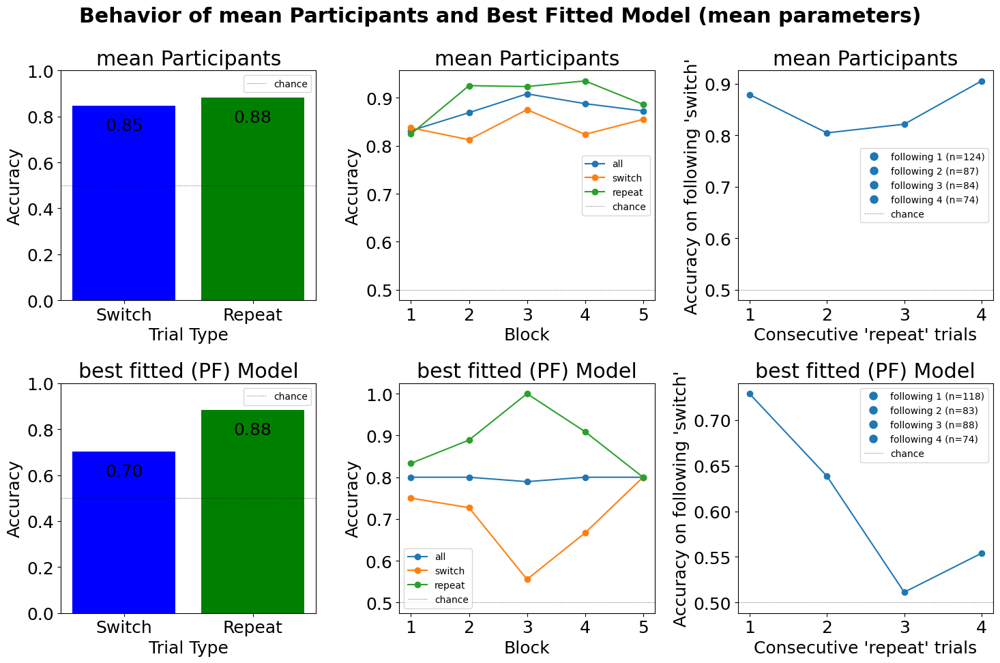

Saved to results/behavioral_comparison_mean_participants_best_fitted_model.png


In [213]:
# concatinate all dataframes
data_all = pd.concat(data_dfs, ignore_index=True)
# calculate std, se and ci bounds for all participants per condition
acc_condition_all = [calculate_accuracy_condition(data) for data in data_dfs] # calculate accuracy per condition for each participant
acc_condition_all_df = pd.DataFrame(acc_condition_all)
acc_condition_summary_df = pd.DataFrame({'mean': acc_condition_all_df.mean(), 
                                         'std': acc_condition_all_df.std(), 
                                         'se': acc_condition_all_df.sem(),
                                        'ci_lower': acc_condition_all_df.mean() - acc_condition_all_df.sem() * 1.96,
                                        'ci_upper': acc_condition_all_df.mean() + acc_condition_all_df.sem() * 1.96,
                                        'count': acc_condition_all_df.count()})
# plot reference
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
axs = axs.ravel()
fig.suptitle('Behavior of mean Participants and Best Fitted Model (mean parameters)', fontweight='bold')

plot_accuracy_condition(acc_condition_summary_df['mean'], ax=axs[0])
axs[0].set_title('mean Participants')
axs[0].axhline(0.5, color="black", linestyle="--", label="chance", alpha=0.5, linewidth=0.5)
axs[0].legend(fontsize=10)
# include the IC and the count of participants

acc_blocks = calculate_accuracy_across_blocks(data_all, num_blocks=5)
plot_accuracy_across_blocks(acc_blocks, ax=axs[1])
axs[1].set_title('mean Participants')
axs[1].legend(fontsize=10)

acc_consecutive = calculate_accuracy_consecutive_condition(data_all, 'repeat', 'switch', max_consecutive=4)
plot_accuracy_consecutive_condition(acc_consecutive, 'repeat', 'switch', ax=axs[2])
axs[2].set_title('mean Participants')

# behavior of the best fitted model with mean parameters
# get fitted model with the highest count and its mean parameters
best_model = results_df['best_model'].value_counts().idxmax()
best_model_params = summary_stats_fit_df.loc[best_model, ['g', 'c', 'alpha', 'gamma']].xs('mean', level=1).values
num_fitted_participants = int(summary_stats_fit_df.loc[best_model, 'count'])
num_total_participants = len(data_dfs)

best_model_params = best_model_params.astype(float)
print(f"Best Model: {best_model}, fitted {num_fitted_participants} out of {num_total_participants} participynts ({num_fitted_participants/num_total_participants * 100}%)")

# simulate the fitted model with the mean parameters
num_trials = 100
T = 2
sigma = 0.2
tau_P = 2/T
x_0 = [0.5, 0.5, 0]

data_best_fit = simulate_experiment(num_trials, T, x_0, *best_model_params, sigma, tau_P)

# plot the behavior of the fitted model with the mean parameters
acc_conditions_model = calculate_accuracy_condition(data_best_fit)
plot_accuracy_condition(acc_conditions_model, ax=axs[3])
axs[3].axhline(0.5, color="black", linestyle="--", label="chance", alpha=0.5, linewidth=0.5)
axs[3].set_title(f'best fitted ({best_model}) Model')
axs[3].legend(fontsize=10)

acc_blocks_model = calculate_accuracy_across_blocks(data_best_fit, num_blocks=5)
plot_accuracy_across_blocks(acc_blocks_model, ax=axs[4])
axs[4].set_title(f'best fitted ({best_model}) Model')
axs[4].legend(fontsize=10)

# similar to participants analysis, and since the consecutive condition analysis depends on task distribution
# simulated data of the model on the same trial sequence as the participants and concatenate all dataframes
experiment_trials_same_sequence = [generate_experiment_trials_fromData(data) for data in data_dfs]
data_best_fit_same_trial_sequence = [simulate_experiment(num_trials, T, x_0, *best_model_params, sigma, tau_P, task_sequence=task_sequence) for task_sequence in experiment_trials_same_sequence]
data_best_fit_same_trial_sequence = pd.concat(data_best_fit_same_trial_sequence, ignore_index=True)
acc_consecutive_model = calculate_accuracy_consecutive_condition(data_best_fit_same_trial_sequence, 'repeat', 'switch', max_consecutive=4)
# OR we use one simulated data from the model
# acc_consecutive_model = calculate_accuracy_consecutive_condition(data_best_fit, 'repeat', 'switch', max_consecutive=4)
plot_accuracy_consecutive_condition(acc_consecutive_model, 'repeat', 'switch', ax=axs[5])
axs[5].set_title(f'best fitted ({best_model}) Model')

plt.tight_layout()
plt.show()

if SAVE_RESULTS:
    fig.savefig(f'{RESULTS_DIR}/behavioral_comparison_mean_participants_best_fitted_model.png')
    print(f"Saved to {RESULTS_DIR}/behavioral_comparison_mean_participants_best_fitted_model.png")